# Space Stretching

In this notebook we analize how the linear and non-linear transformations, in consequence the neural networks, modify the points in the dimensional space.

## Configuration and definition

In [1]:
# Load libraries
import torch
import torch.nn as nn
from res.plot_lib import set_default, show_scatterplot, plot_bases
from matplotlib.pyplot import plot, title, axis, show

In [2]:
# Set style (needs to be in a new cell)
set_default()

In [3]:
from IPython.core.display import display, HTML
display(HTML("<style>div.output_scroll { height: 44em; }</style>"))

In [4]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

## Generate and visualize points in 2-D space

We generate some random points in 2-D space with a Normal Distribution with center `0` and variance `1` (also called the standard normal distribution).

In [5]:
torch.cat((torch.zeros(2, 2), torch.eye(2)))

tensor([[0., 0.],
        [0., 0.],
        [1., 0.],
        [0., 1.]])

Generated 1000 points in  2 dimension space, represented with a [1000, 2] matrix


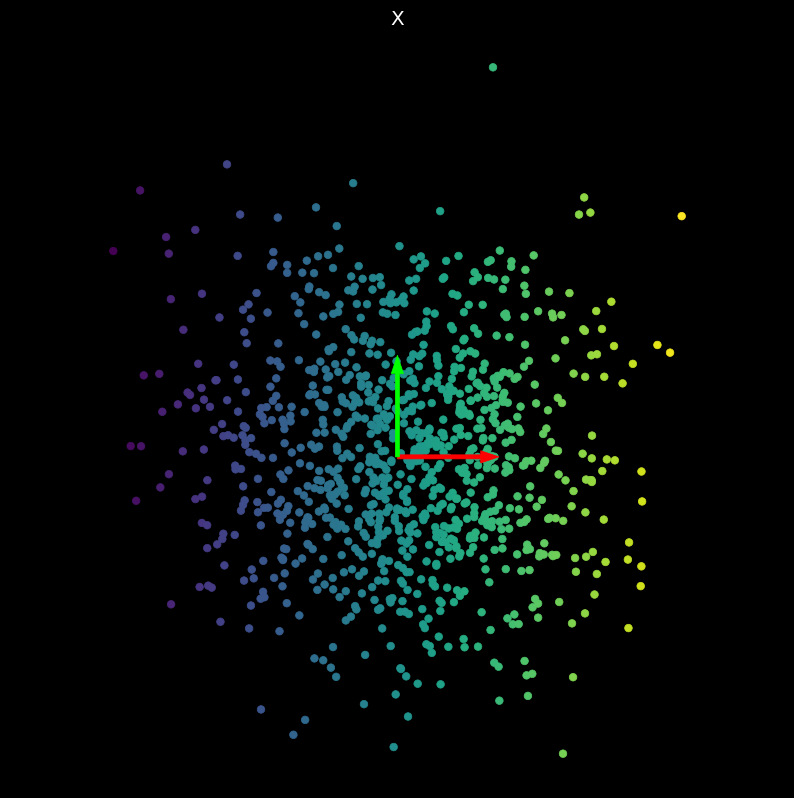

In [6]:
# generate some points in 2-D space from a Normal Distribution 
n_points = 1000
X = torch.randn(n_points, 2).to(device) # 1000,2
print(f"Generated {n_points} points in  {X.dim()} dimension space, represented with a {list(X.size())} matrix")
colors = X[:, 0]

# Print the scatterplot with the generated random points colored by the x's axis (first column) 
show_scatterplot(X, colors, title='X')

# Print base axis (x, y) 
OI = torch.cat((torch.zeros(2, 2), torch.eye(2))).to(device)
plot_bases(OI)

## Doubt: why OI is a 4x2 matrix and not 2x2? Why it includes 2x2 of zeros at the beggining?
## Response: Because plot_bases function uses as basis 2 vectors. 
##           A vector is defined by the origin point and the head point. In detail, it uses 4 points.
##           The x's base is defined by the position [0] (0,0) and the position [2] (1,0)
##           The y's base is defined by the position [1] (0,0) and the position [3] (0,1)


## Visualizing Linear Transformations

* Generate a random matrix $W$

$
\begin{equation}
    W = U
  \left[ {\begin{array}{cc}
   s_1 & 0 \\
   0 & s_2 \\
  \end{array} } \right]
  V^\top
\end{equation}
$
* Compute $y = Wx$
* Larger singular values stretch the points
* Smaller singular values push them together
* $U, V$ rotate/reflect

--------------------

I understand that any matrix can be decomposited by = U @ S @ Vt 
Where:

 - S represents the value by axis. For example, in a 2-dimensional space there are the axis x with unit vector i (1,0) and the axis y with the unit vector j (0,1). In this case, (s1,0) represents the position in the axis x, and (0,s2) represents the position in y.
 
 - U and V are matrixes to rotate or reflect the points. 

I go to make some tests to demostrate this ideas:

In [7]:
# I understand: any matrix can be decomposited by = U @ S @ Vt 
W = torch.randn(2, 2)
print("Example random matrix :")
print(W)
print()

# Torch svd method gets this matrixes from the final matrix
U, S, V = torch.svd(W)
print(f"Decomposition in U, S, V matrixes")
print("U matrix :")
print(U)
print("\nV matrix :")
print(V)
print("\nS matrix :")
print(S)
print()

# Remake W from U, S and V matrix
# W2 = U @ torch.Tensor([[S[0],0],[0, S[1]]]) @ V.t()
W2 = torch.mm(torch.mm(U, torch.diag(S)), V.t())
print("Reconstruction of the example matrix with : U @ S @ Vt")
print(W2)

Example random matrix :
tensor([[-2.0356, -0.7975],
        [-0.6838, -0.9065]])

Decomposition in U, S, V matrixes
U matrix :
tensor([[-0.9046, -0.4263],
        [-0.4263,  0.9046]])

V matrix :
tensor([[ 0.8874,  0.4609],
        [ 0.4609, -0.8874]])

S matrix :
tensor([2.4034, 0.5409])

Reconstruction of the example matrix with : U @ S @ Vt
tensor([[-2.0356, -0.7975],
        [-0.6838, -0.9065]])


-------

Ok, now if I only apply a transformation 

$y = Wx$ 

with the $x=X$ (ramdom previously generate points) and with $W$ only with $S$, I should only change the axis vectors. 

This is, if $U$ and $V$ are identity matrix implies no rotation/reflection. In this case, $S$ represents a change in the unit vectors of each axis (for example, $i$ and $j$ in 2D). In detail:

```
point_a = [3,2] = 3i + 2j = 3[1,0] + 2[0,1]

S = [[10,0],[0,0.5]]

y_a = point_a * S = [3,2] * [[10,0],[0,0.5]] = [30+0, 0+1] = [30,1] 

```

Now, if we descompose this point exactly as after:

```
y_a = [30,1] = 30i + 1j = 30[1,0] + 1[0,1] = 3[10,0] + 2[0,0.5] = 3i_new + 2j_new
```

To sum up, it moves the point to other position in the 2D in basis his projection in another scale vector. In our example, the projection of the point (3,2) with the base axis is (30,1) in the new base axis. **It can be understand as expand or shrink each value by axis**.

* Larger singular values stretch the points
* Smaller singular values push them together

In [8]:
# Identity matrixes
U = torch.eye(2)
V = torch.eye(2)

# Example S
S = torch.diag(torch.Tensor([10, 0.5]))

W = torch.mm(torch.mm(U,S), V.t())

print(f"Original S matrix : ")
print(S)

print(f"\nFinal weight matrix with U and V as identity matrixes")
print(W)

Original S matrix : 
tensor([[10.0000,  0.0000],
        [ 0.0000,  0.5000]])

Final weight matrix with U and V as identity matrixes
tensor([[10.0000,  0.0000],
        [ 0.0000,  0.5000]])


In [9]:
# Initial point
point_a = torch.Tensor([3,2])

# Visualize it
print(f"Initial point : {point_a.numpy()}")
# plot(point_a[0], point_a[1], 'ro')
# show()

Initial point : [3. 2.]


In [10]:
y_a = point_a @ W

print(f"Transformed point : {y_a.numpy()}")
# plot(y_a[0], y_a[1], 'ro')
# show()

Transformed point : [30.  1.]


Now I am going to test to transform all the generated points to random scales (only S;U and V are identity matrixes):

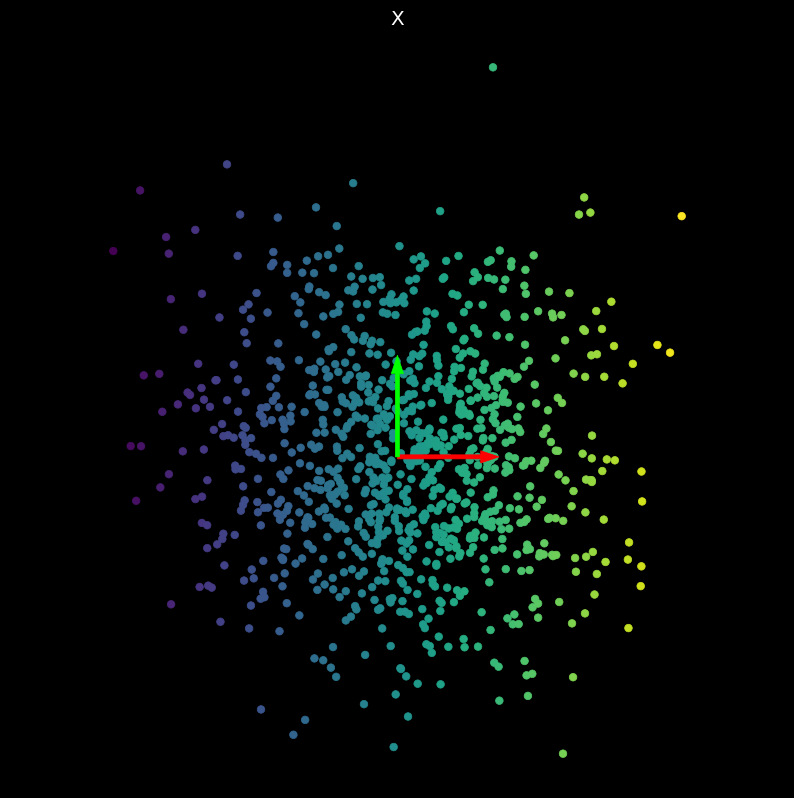

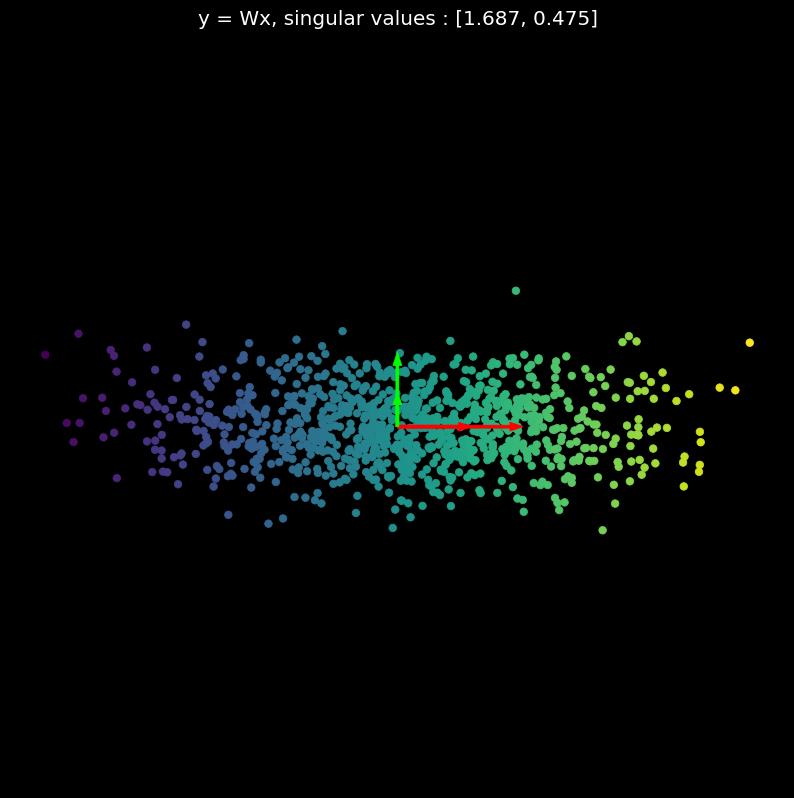

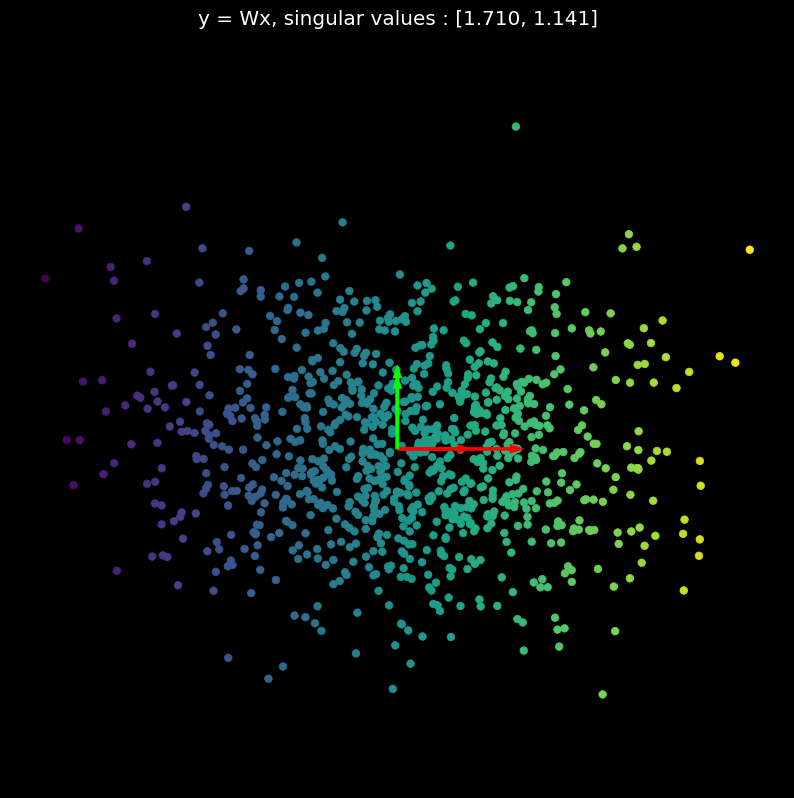

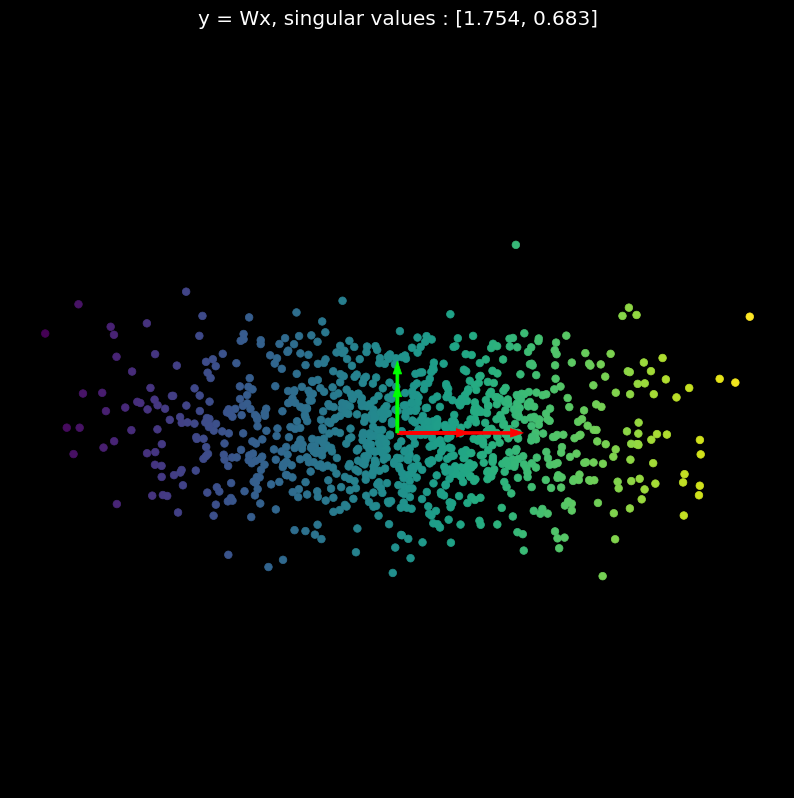

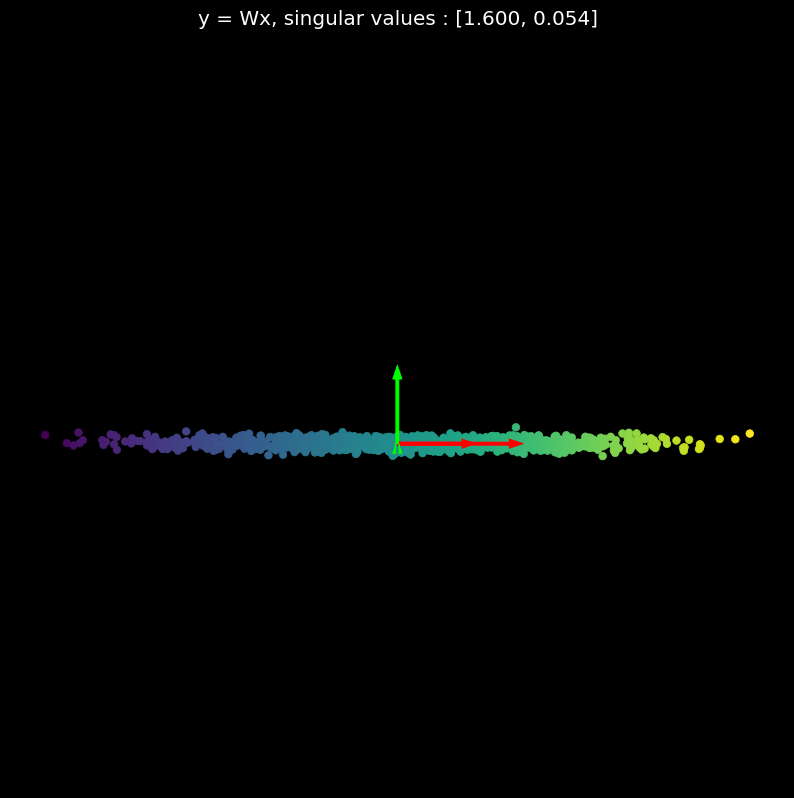

...

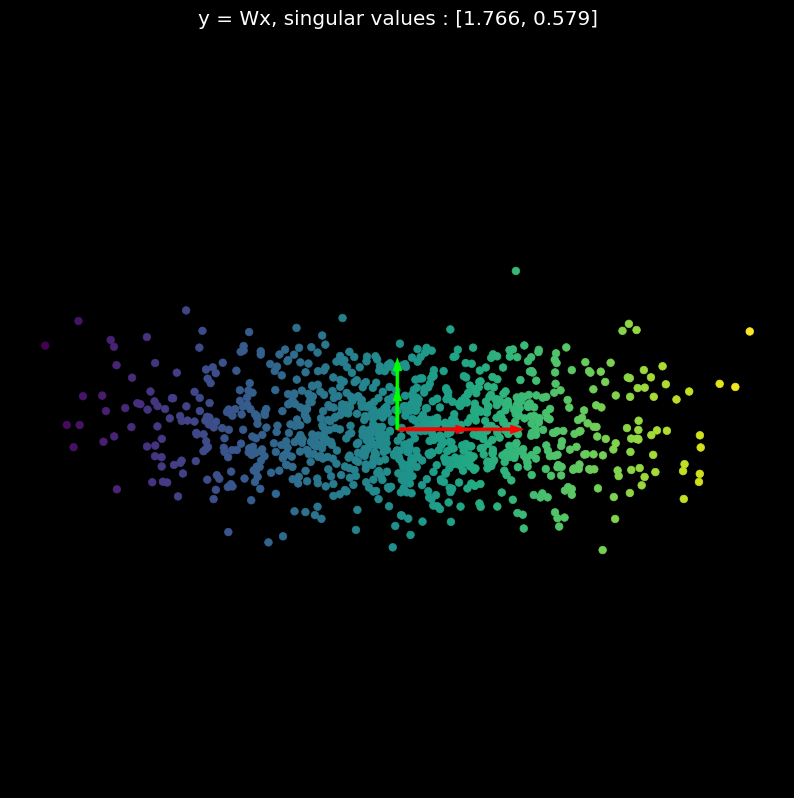

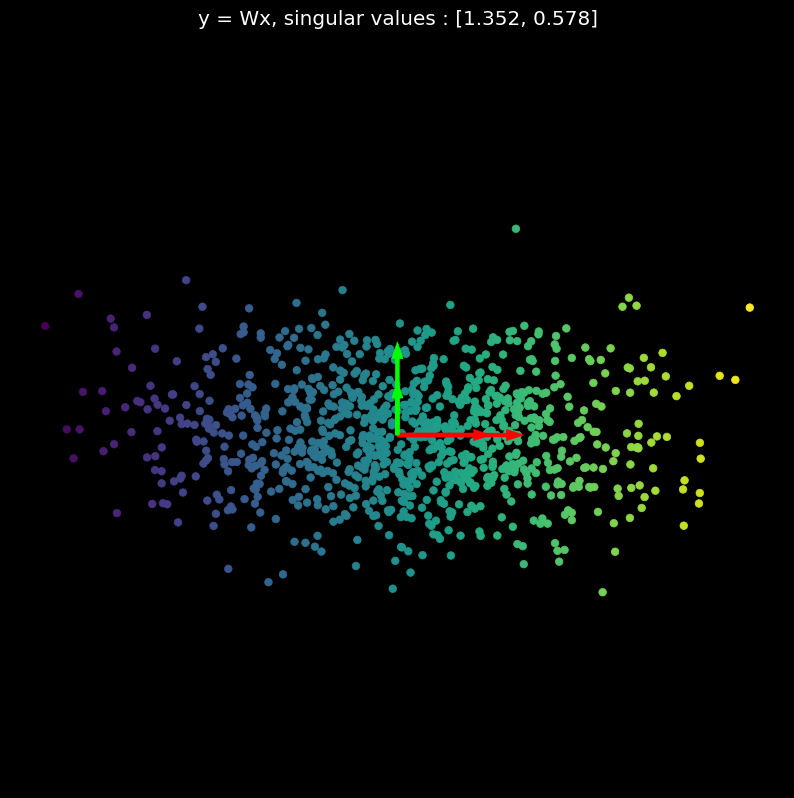

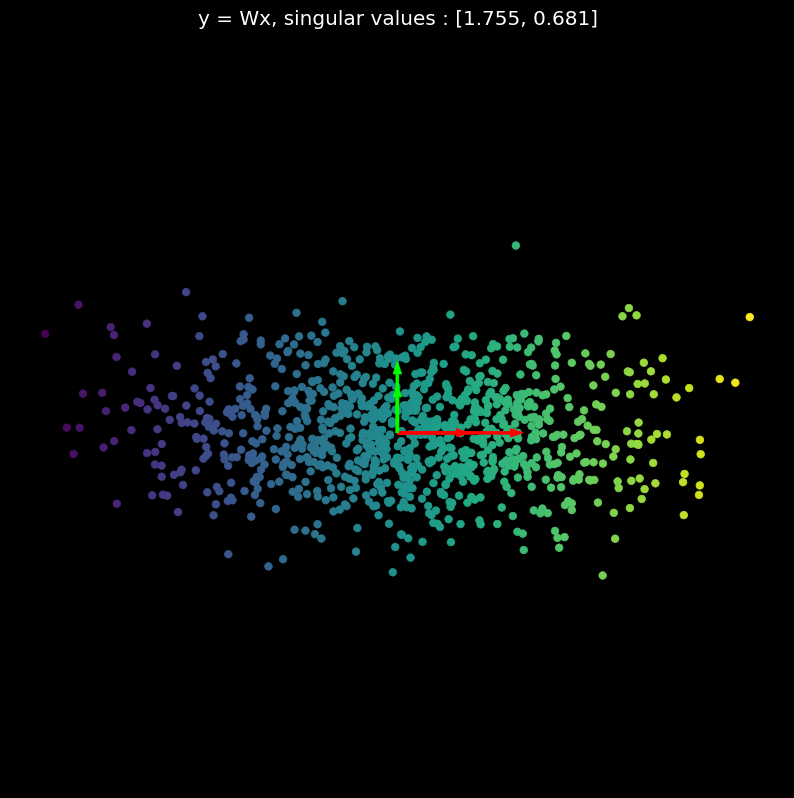

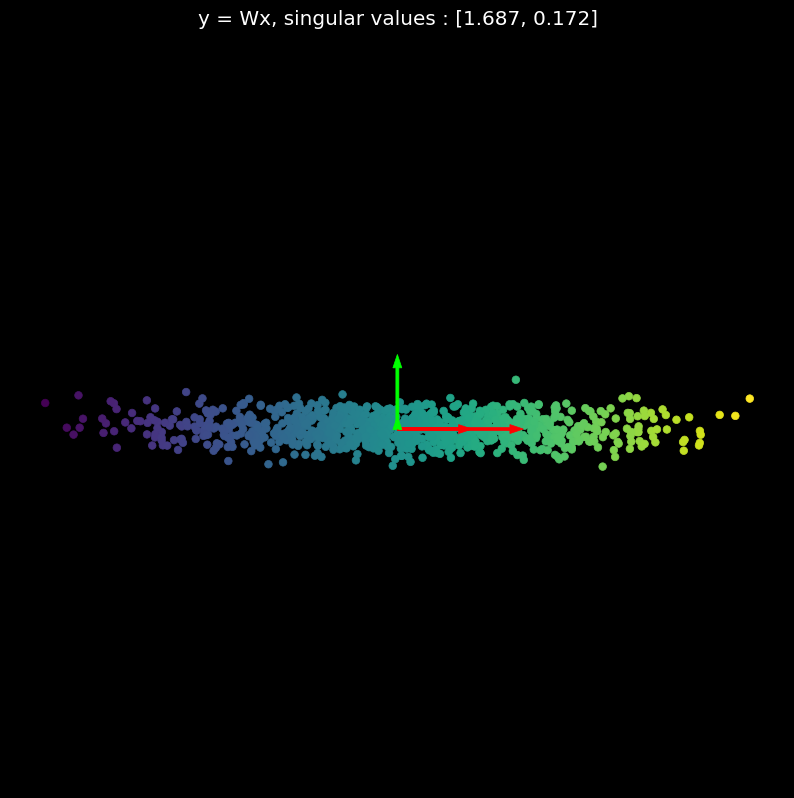

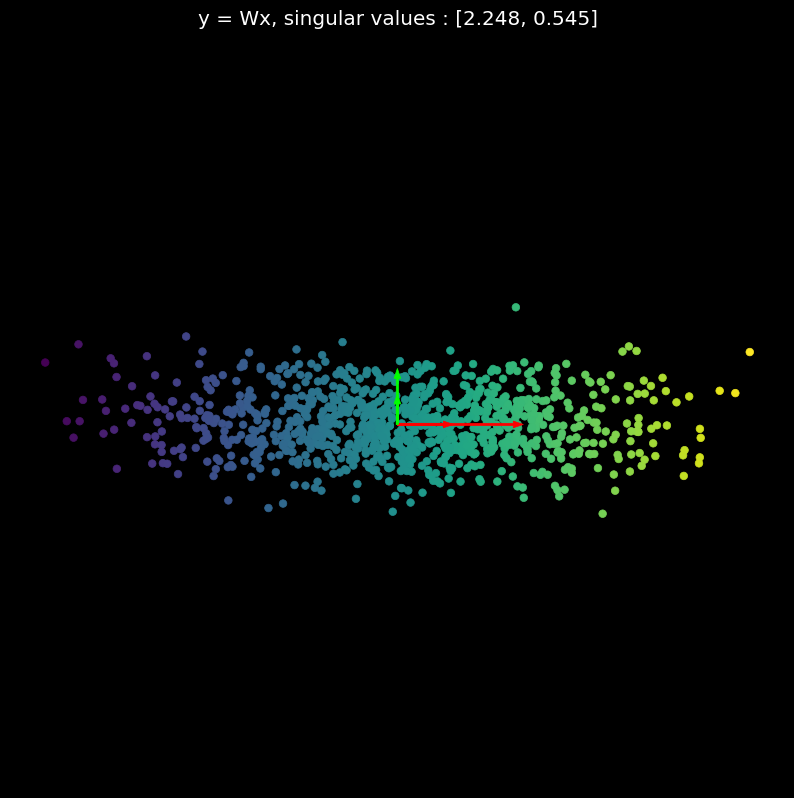

In [11]:
show_scatterplot(X, colors, title='X')
plot_bases(OI)

for i in range(10):
    # create a random matrix
    W = torch.randn(2, 2).to(device)
    
    # compute singular values
    U, S, V = torch.svd(W)
    
    W_new = torch.diag(S)
    
    # transform points only by S
    Y = X @ W_new.t()
    
    # plot transformed points
    show_scatterplot(Y, colors, title='y = Wx, singular values : [{:.3f}, {:.3f}]'.format(S[0], S[1]))
    
    # transform the basis
    new_OI = OI @ W_new.t()
        
    # plot old and new basis
    plot_bases(OI)
    plot_bases(new_OI)
    show()

As you can see, if we don't rotate or reflect the points using the S and V matrixes, you only expand (singular values bigger than 1) or shrink (singular values less than 1) each axis.

------------------------

Ok, now, what happen if we only rotate or reflect the points? That is, if in the tranformation only affects the $U$ and/or $V$ matrixes. It implies the $S$ matrix is an identity matrix. In theory, the points should rotate in the axis but with the same exact distribution (the distance between points should remains equal).

For example, if the only valuable matrix is the $U$:

In [12]:
# Example U
W = torch.randn(2, 2)
U, S, V = torch.svd(W)

# Identity matrixes
S = torch.eye(2)
V = torch.eye(2)

W = torch.mm(torch.mm(U,S), V.t())

print(f"Original U matrix : ")
print(U)

print(f"\nFinal weight matrix with S and V as identity matrixes")
print(W)

Original U matrix : 
tensor([[-0.7318,  0.6815],
        [ 0.6815,  0.7318]])

Final weight matrix with S and V as identity matrixes
tensor([[-0.7318,  0.6815],
        [ 0.6815,  0.7318]])


In [13]:
import numpy as np
# Initial point
point_a = torch.Tensor([3,2])
point_b = torch.Tensor([4,1])

# Visualize it
print(f"Initial point a : {point_a.numpy()}")
print(f"Initial point b : {point_b.numpy()}")
dist = np.linalg.norm(point_a.numpy()-point_b.numpy())
print("The distance between the points is : {:.3f}".format(dist))

Initial point a : [3. 2.]
Initial point b : [4. 1.]
The distance between the points is : 1.414


In [14]:
y_a = point_a @ W
y_b = point_b @ W

print(f"Transformed point a : {y_a.numpy()}")
print(f"Transformed point b : {y_b.numpy()}")
dist = np.linalg.norm(y_a.numpy()-y_b.numpy())
print("The distance between the points is : {:.3f}".format(dist))

Transformed point a : [-0.8325075  3.5081234]
Transformed point b : [-2.2458246  3.4577837]
The distance between the points is : 1.414


Now I am going to test to transform all the generated points to random rotations and reflections (only $U$, $S$ and $V$ are identity matrixes):

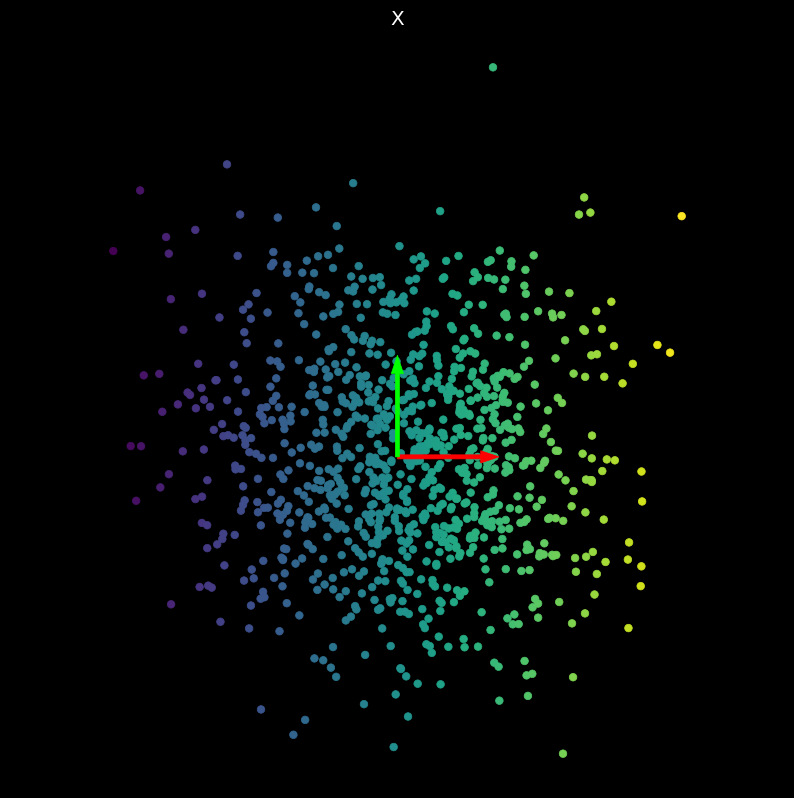

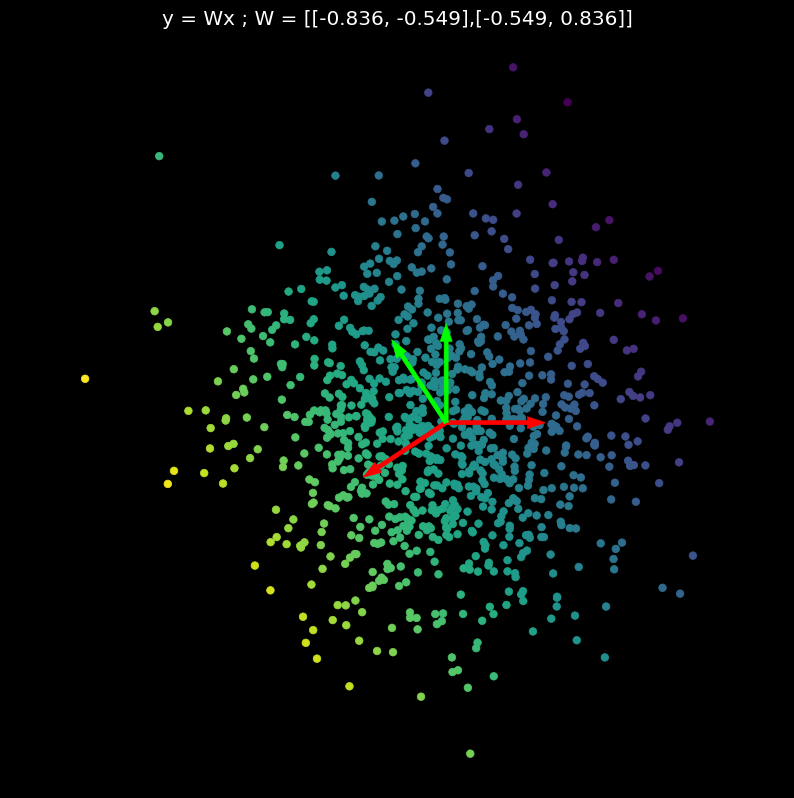

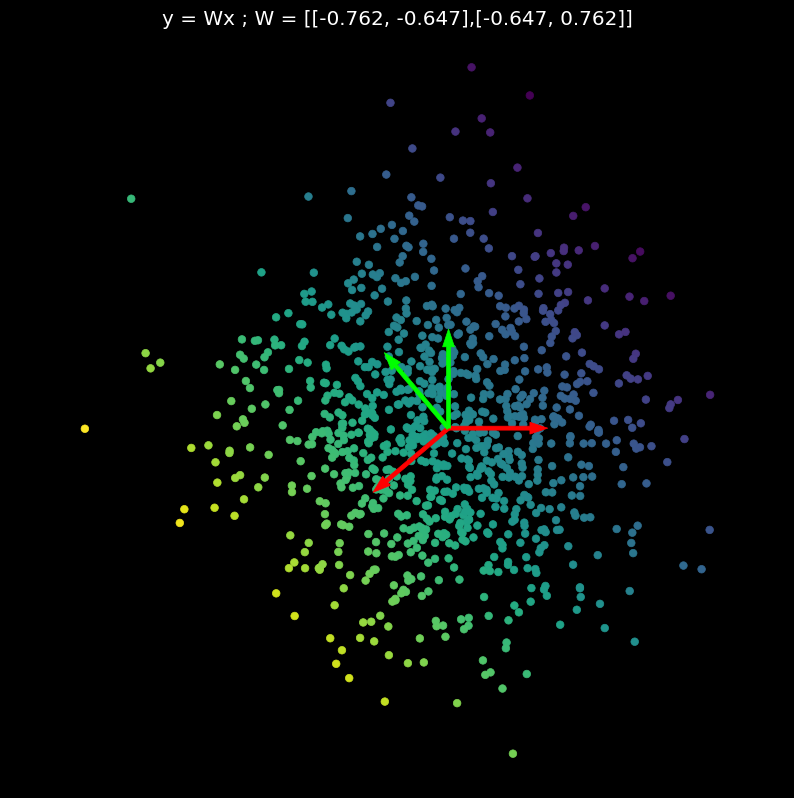

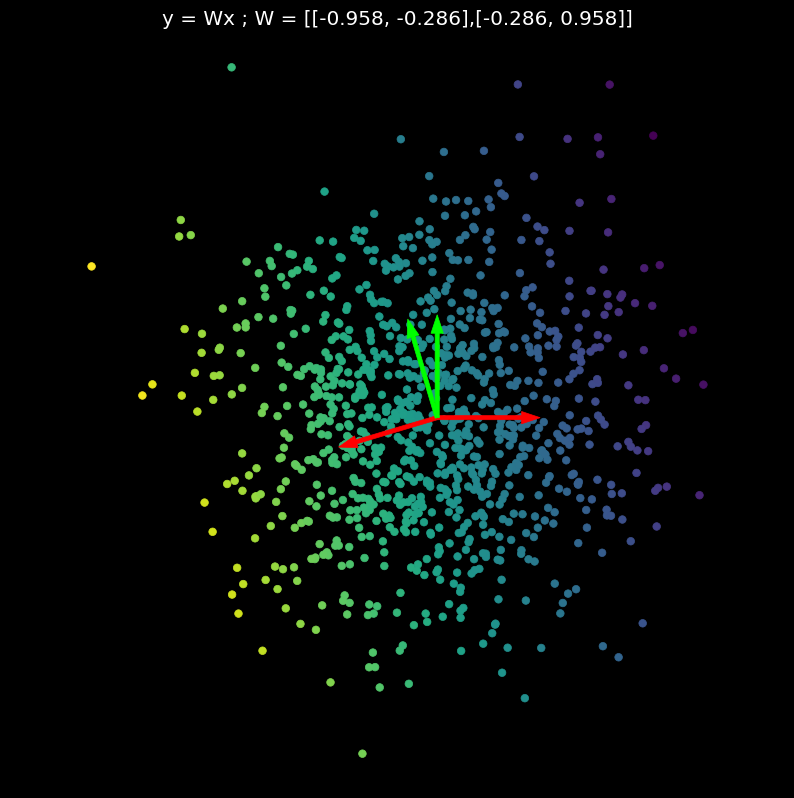

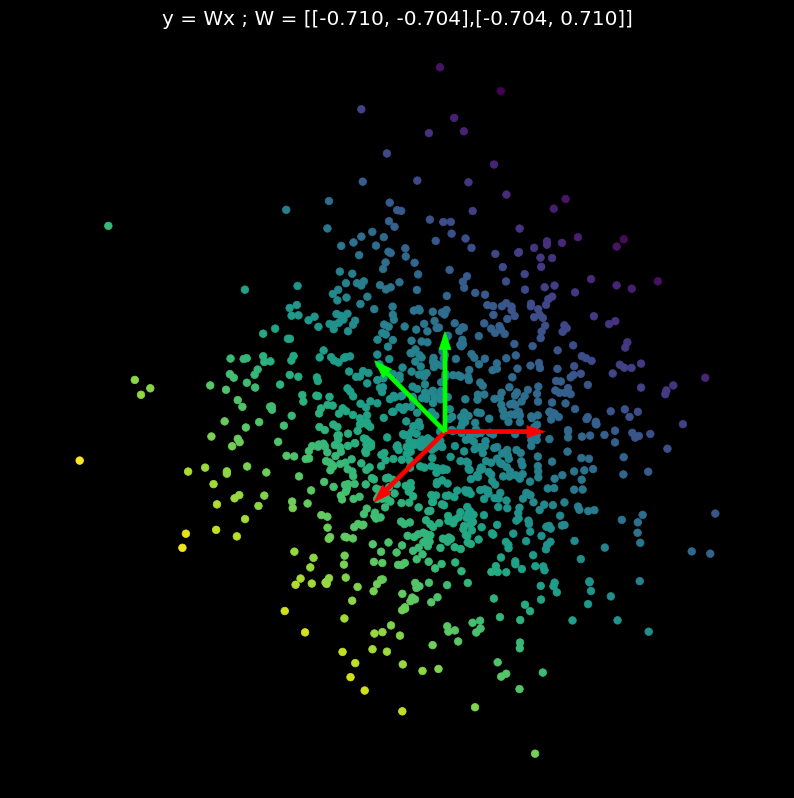

...

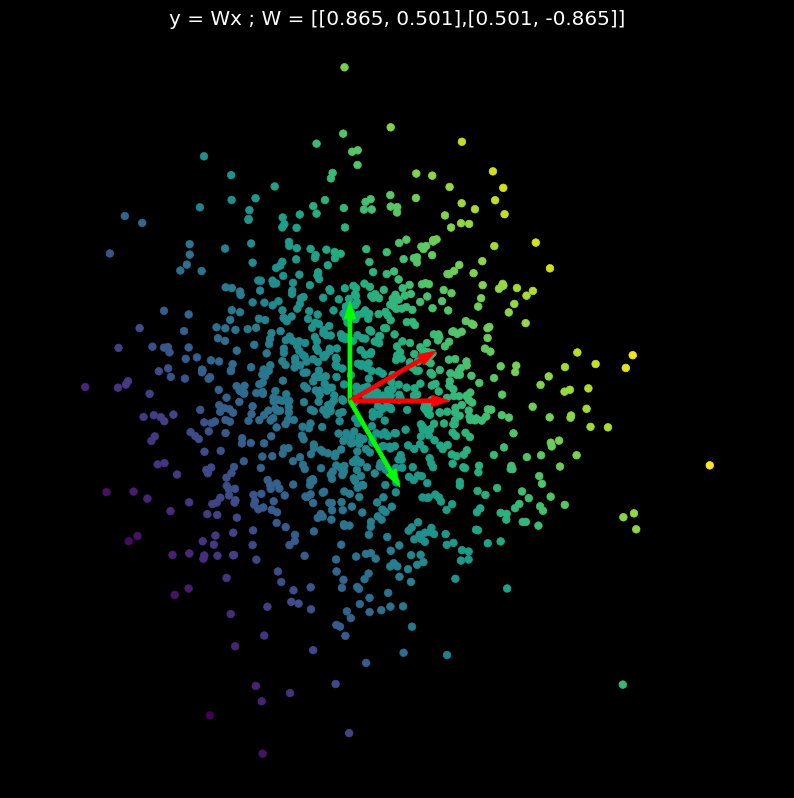

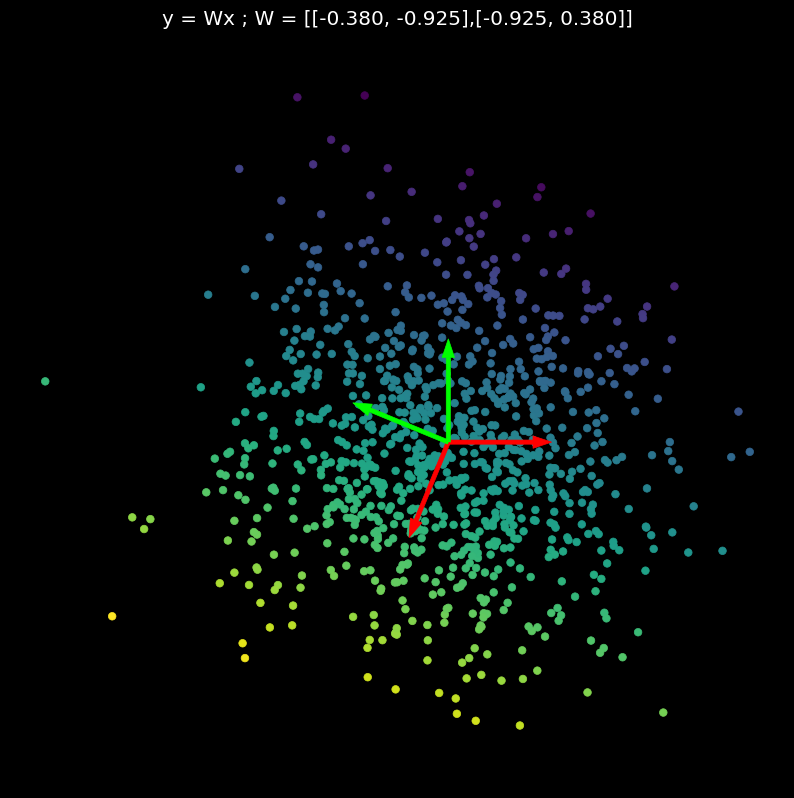

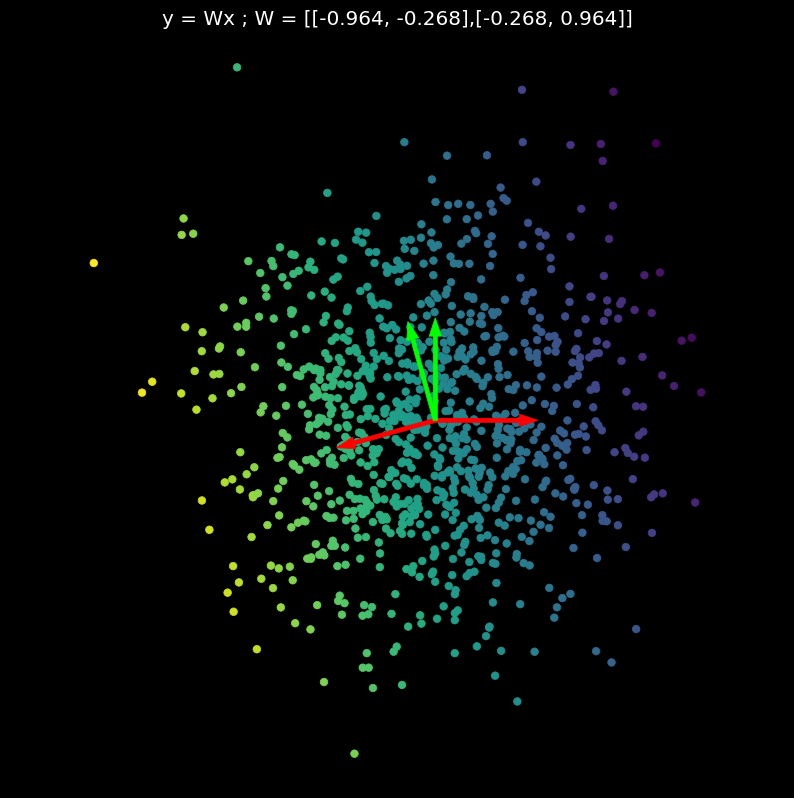

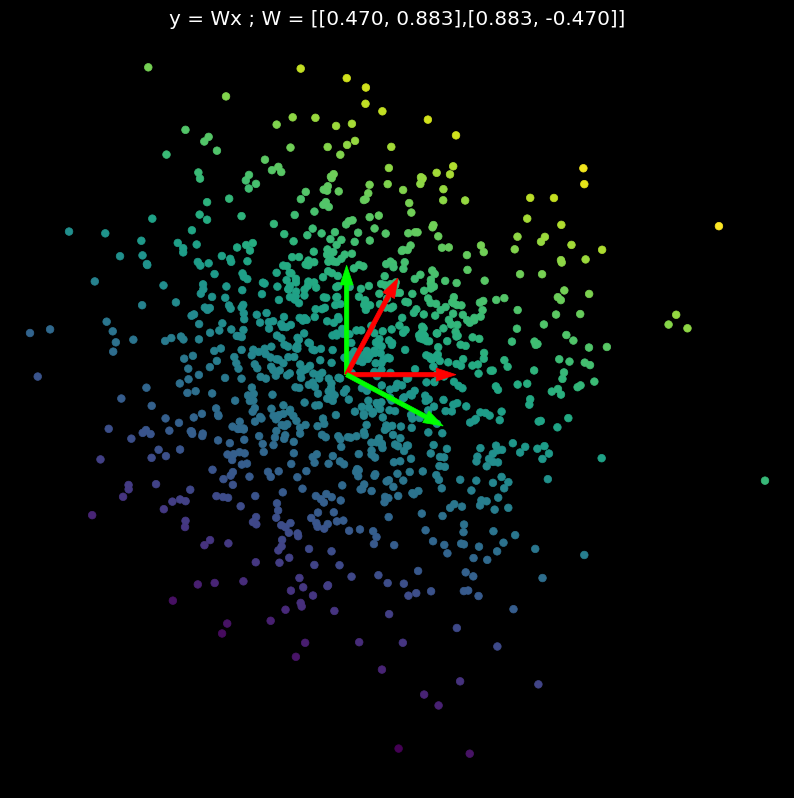

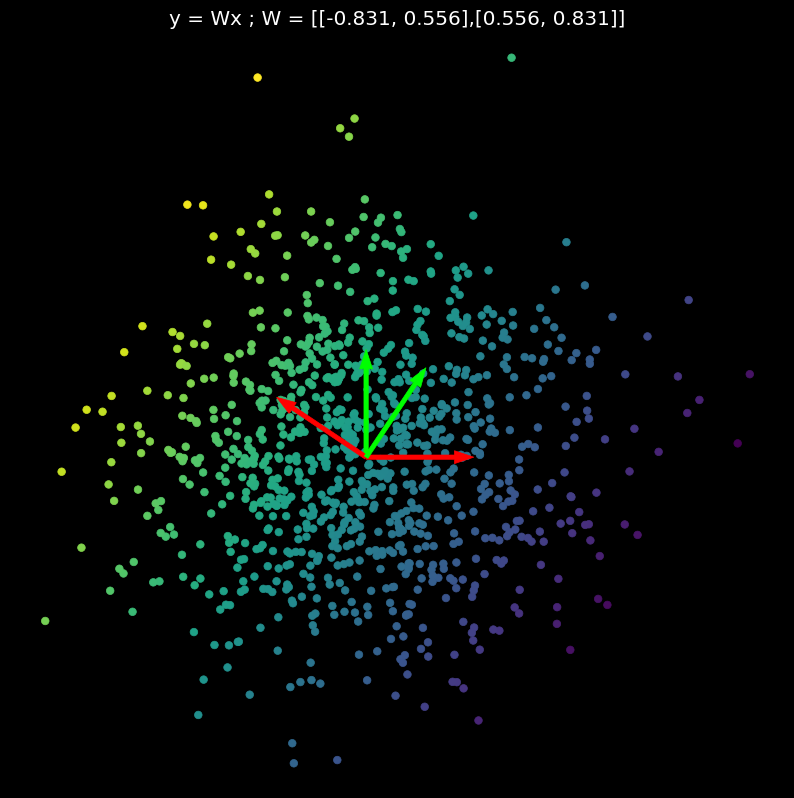

In [15]:
show_scatterplot(X, colors, title='X')
plot_bases(OI)

for i in range(10):
    # create a random matrix
    W = torch.randn(2, 2).to(device)
    
    # compute singular values
    U, S, V = torch.svd(W)
    
    W_new = U
    
    # transform points only by S
    Y = X @ W_new.t()
    
    # plot transformed points
    show_scatterplot(Y, colors, title='y = Wx ; W = [[{:.3f}, {:.3f}],[{:.3f}, {:.3f}]]'.format(W_new[0][0],W_new[0][1], W_new[1][0], W_new[1][1]))
    
    # transform the basis
    new_OI = OI @ W_new.t()
        
    # plot old and new basis
    plot_bases(OI)
    plot_bases(new_OI)
    show()

Now I am going to test to transform all the generated points to random rotations and reflections (only $V$, $S$ and $U$ are identity matrixes):

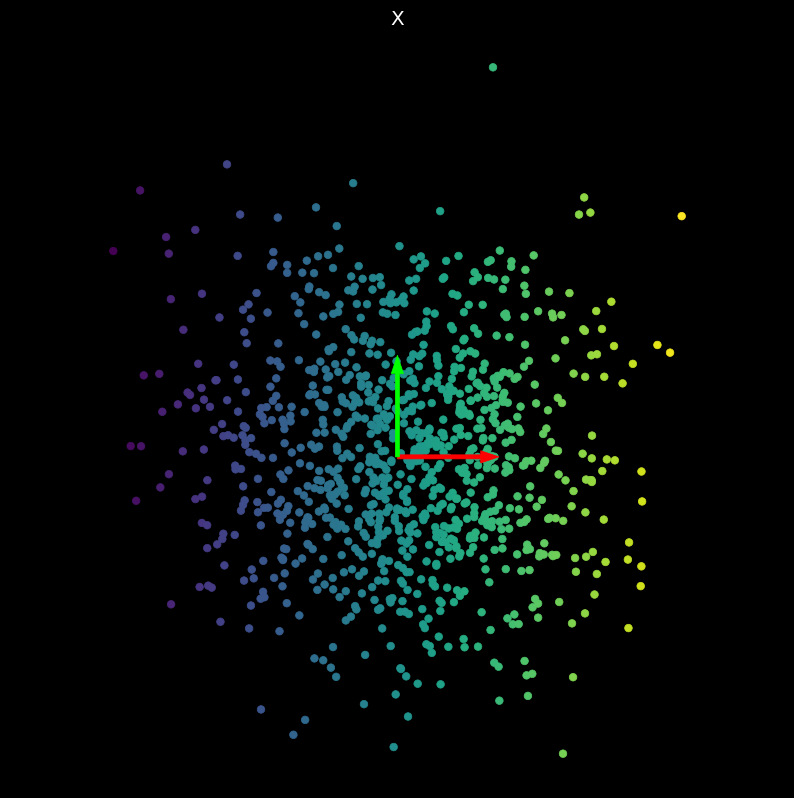

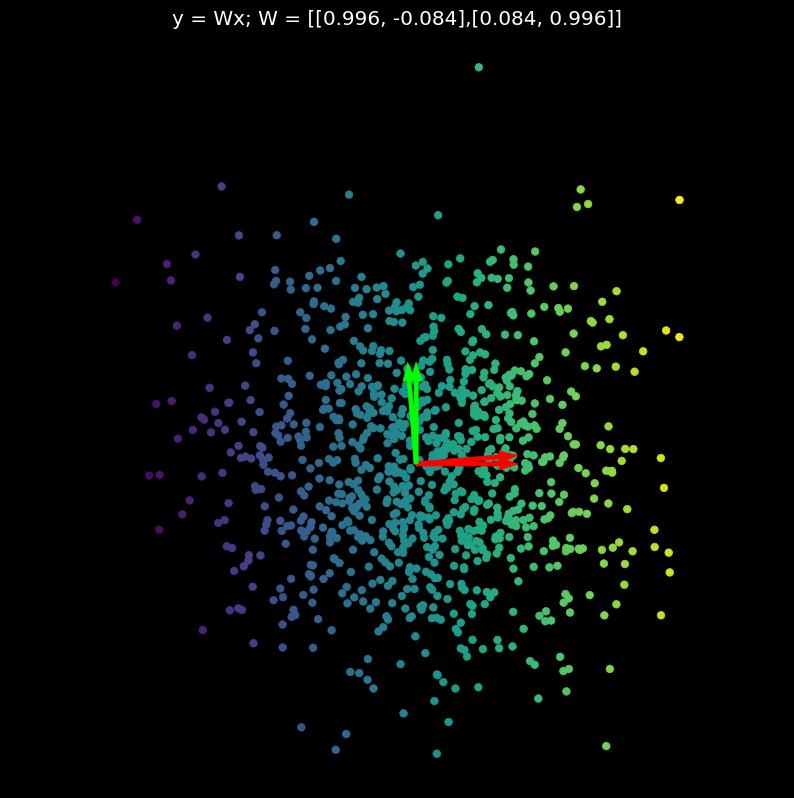

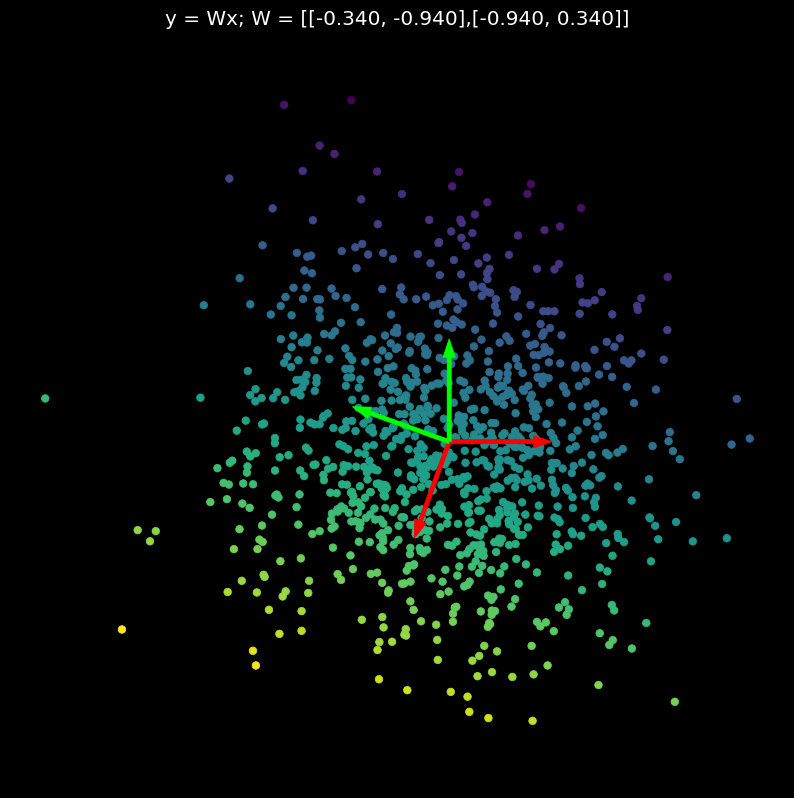

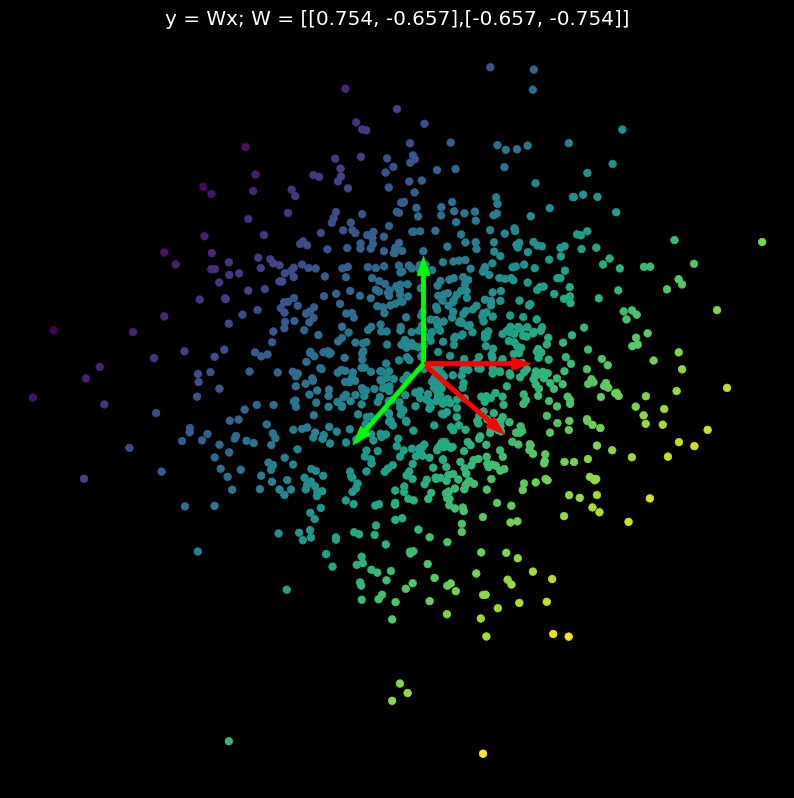

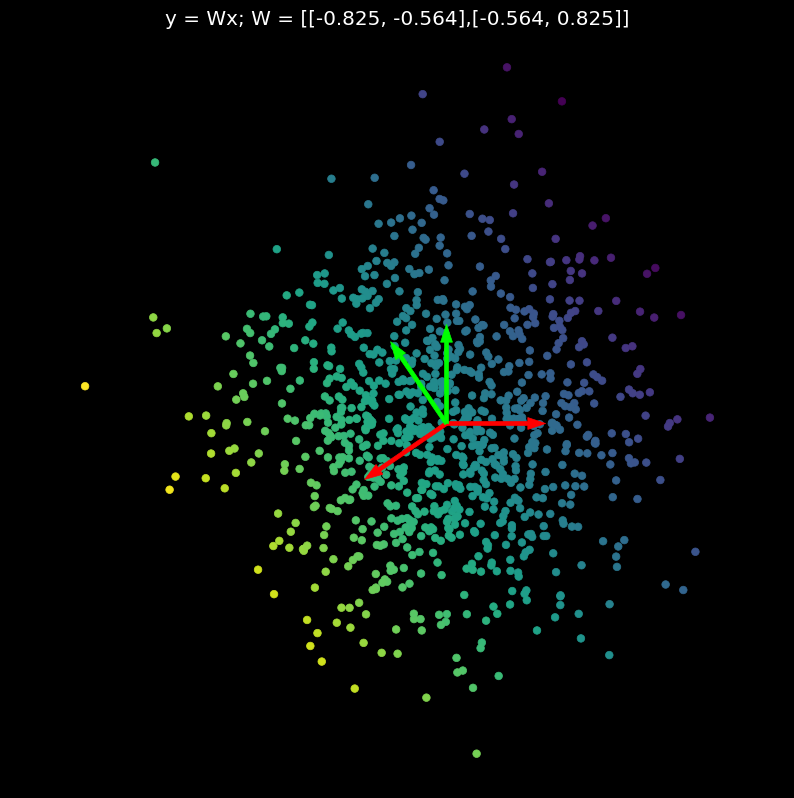

...

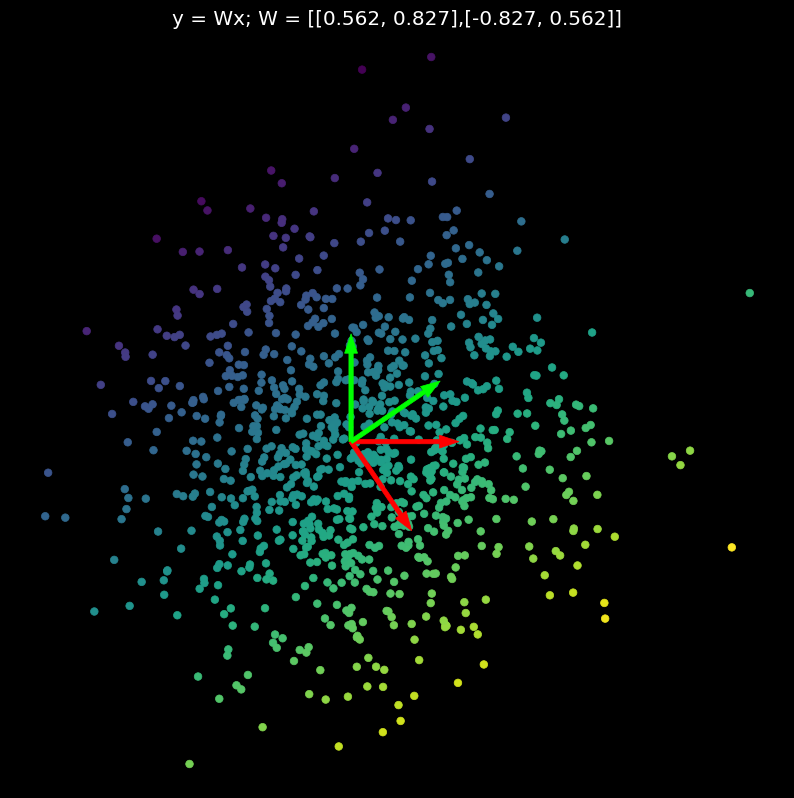

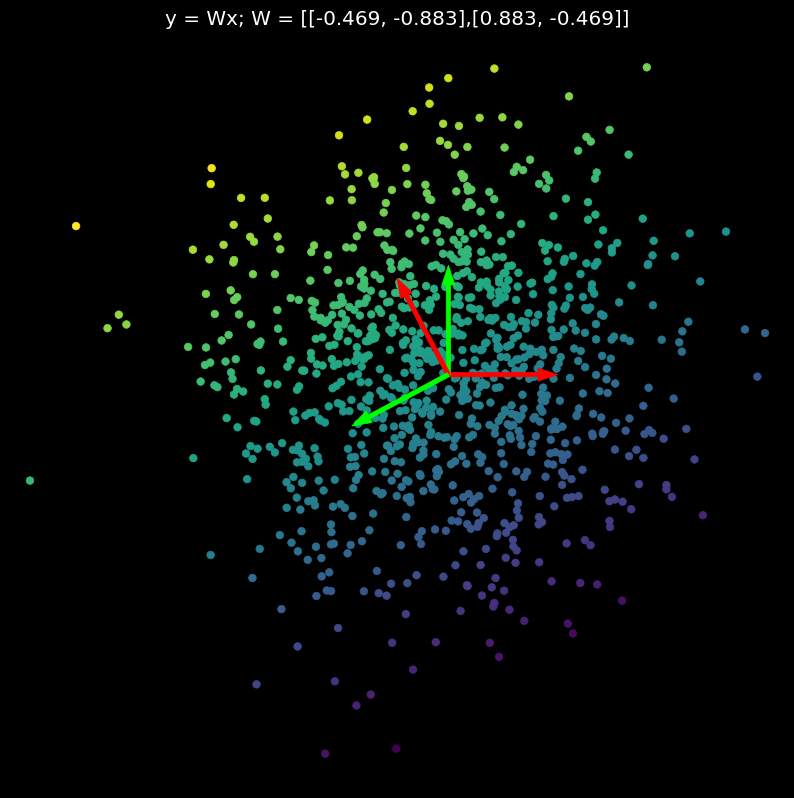

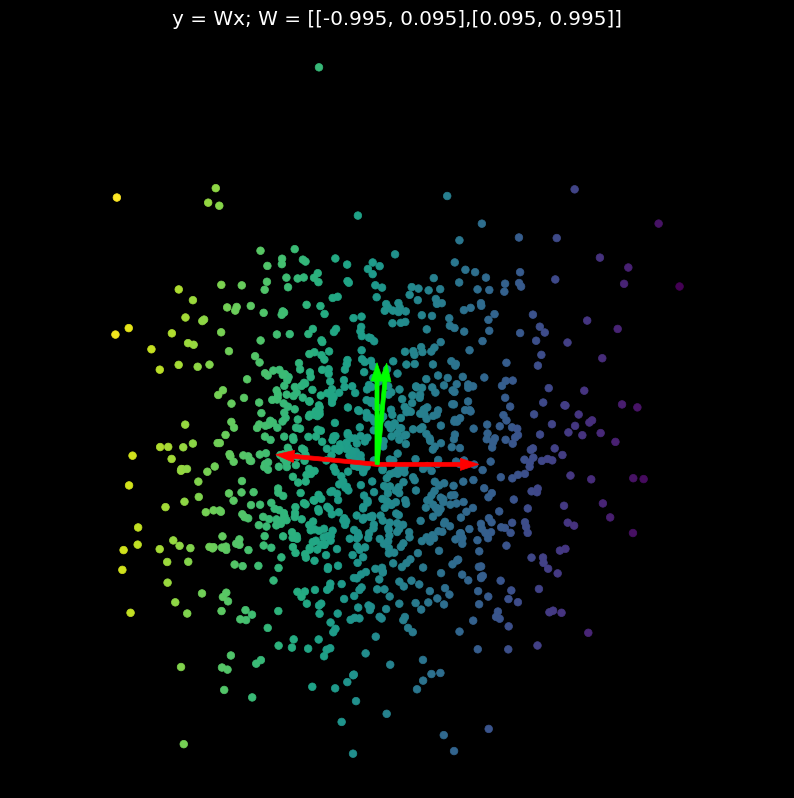

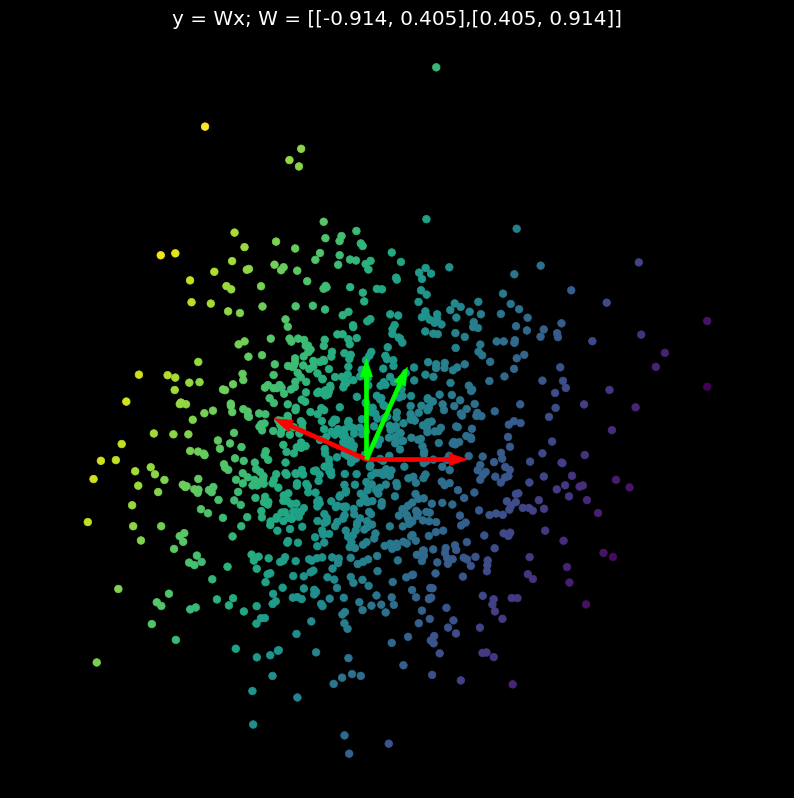

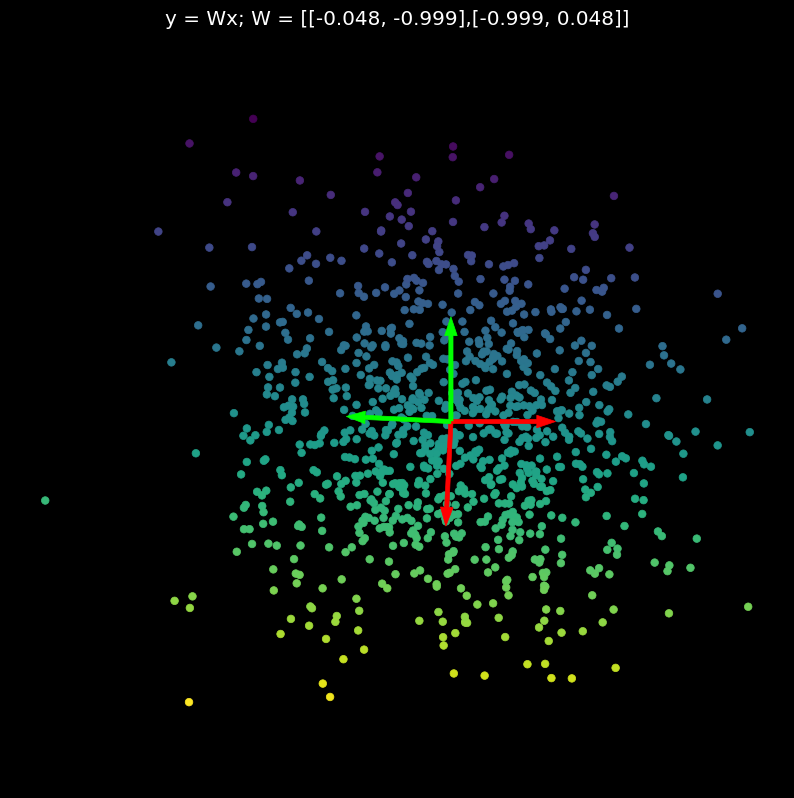

In [16]:
show_scatterplot(X, colors, title='X')
plot_bases(OI)

for i in range(10):
    # create a random matrix
    W = torch.randn(2, 2).to(device)
    
    # compute singular values
    U, S, V = torch.svd(W)
        
    W_new = V
    
    # transform points only by S
    Y = X @ W_new.t()
    
    # plot transformed points
    show_scatterplot(Y, colors, title='y = Wx; W = [[{:.3f}, {:.3f}],[{:.3f}, {:.3f}]]'.format(W_new[0][0],W_new[0][1], W_new[1][0], W_new[1][1]))
    
    # transform the basis
    new_OI = OI @ W_new.t()
        
    # plot old and new basis
    plot_bases(OI)
    plot_bases(new_OI)
    show()

As you can see, the $U$ and $V$ matrixes rotate (i.e., move in a circle round an centre) and reflect (i.e., cause to change direction) the axis, but the distribution remains equal.

------------

Finally, we test to expand and rotate the axis. It is, we train with a $W$ matrix decomposed with $= U @ S @ Vt$ where $U$, $V$ and $S$ are not identity matrixes.

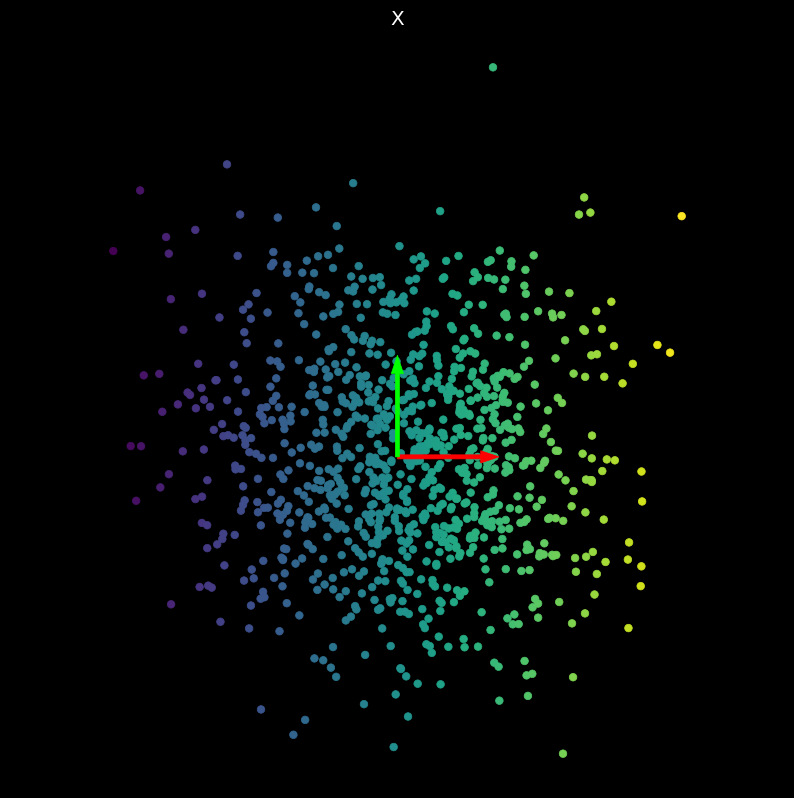

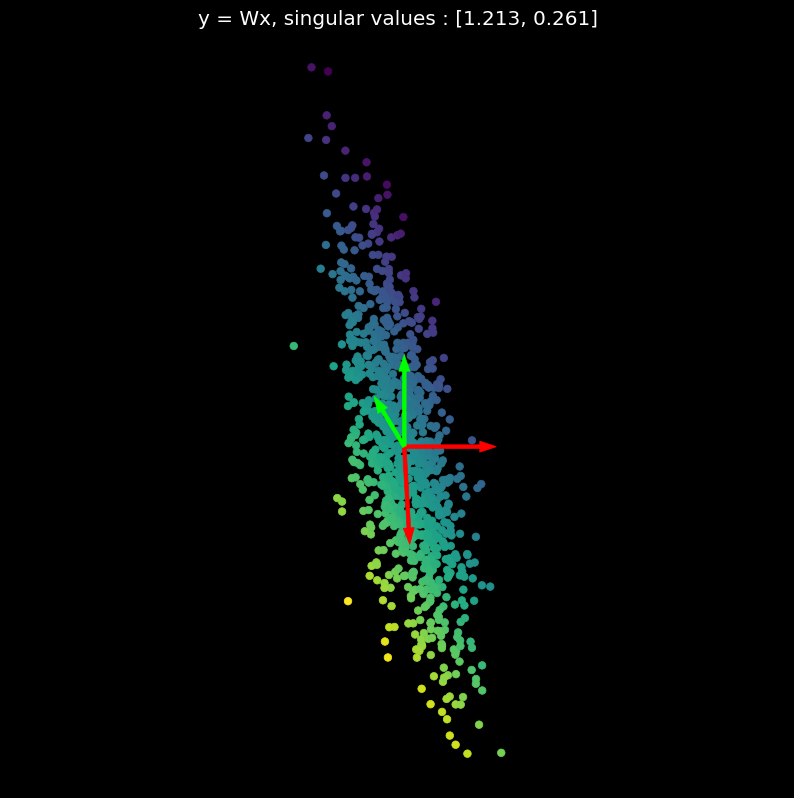

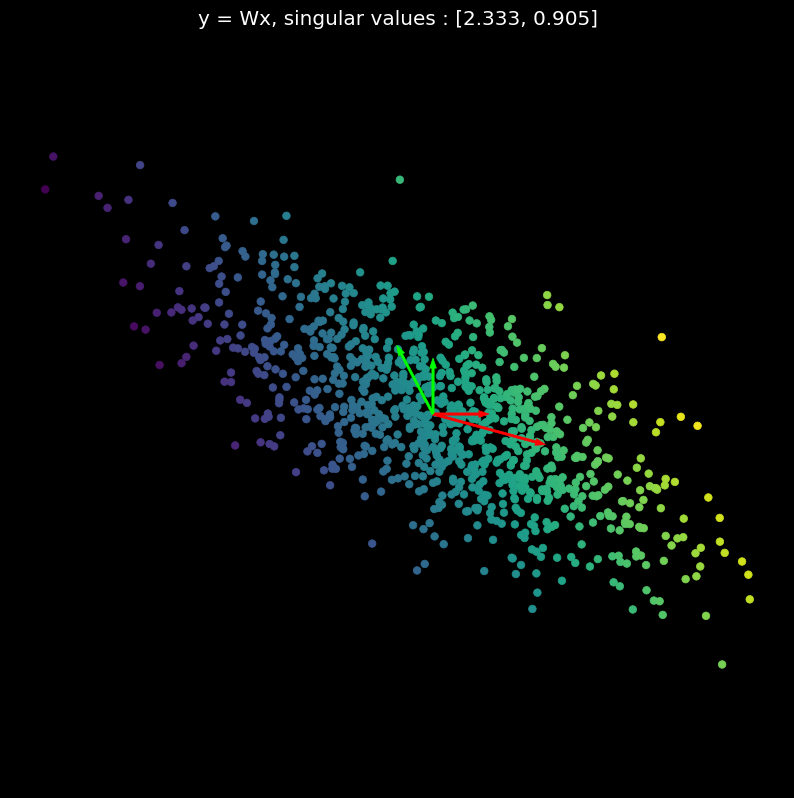

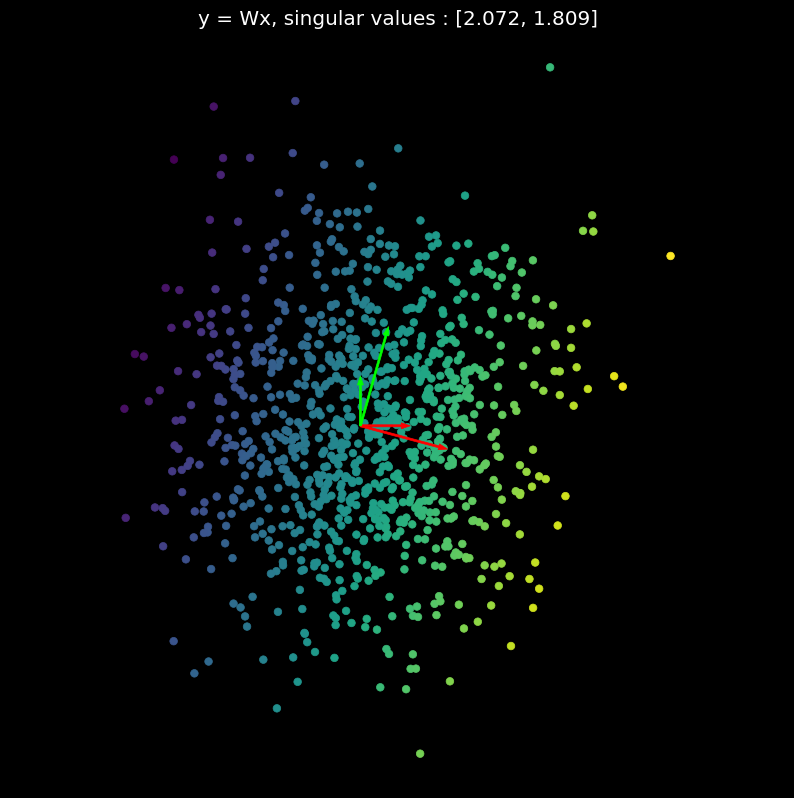

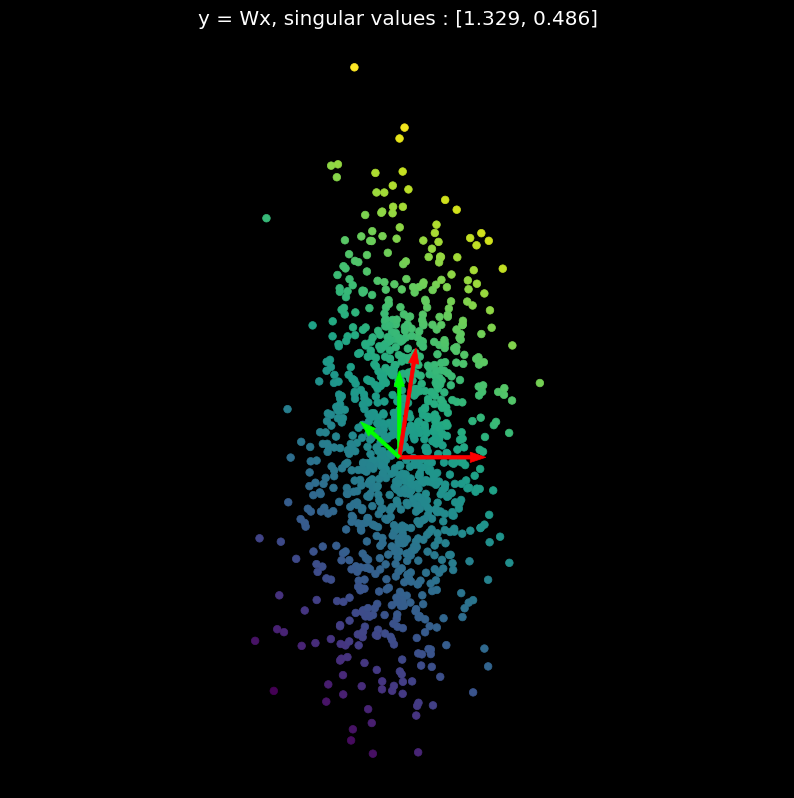

...

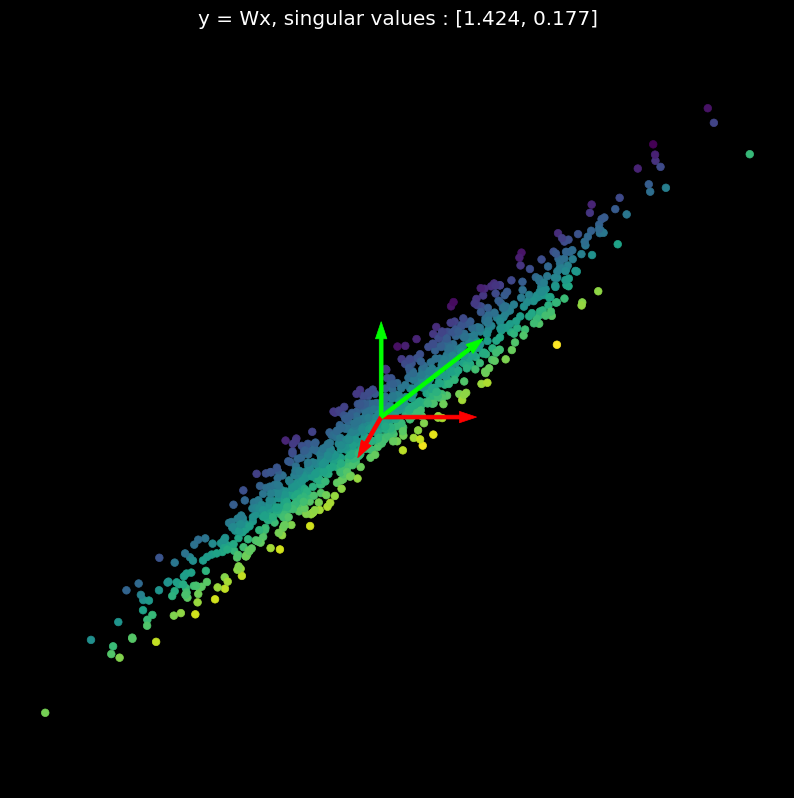

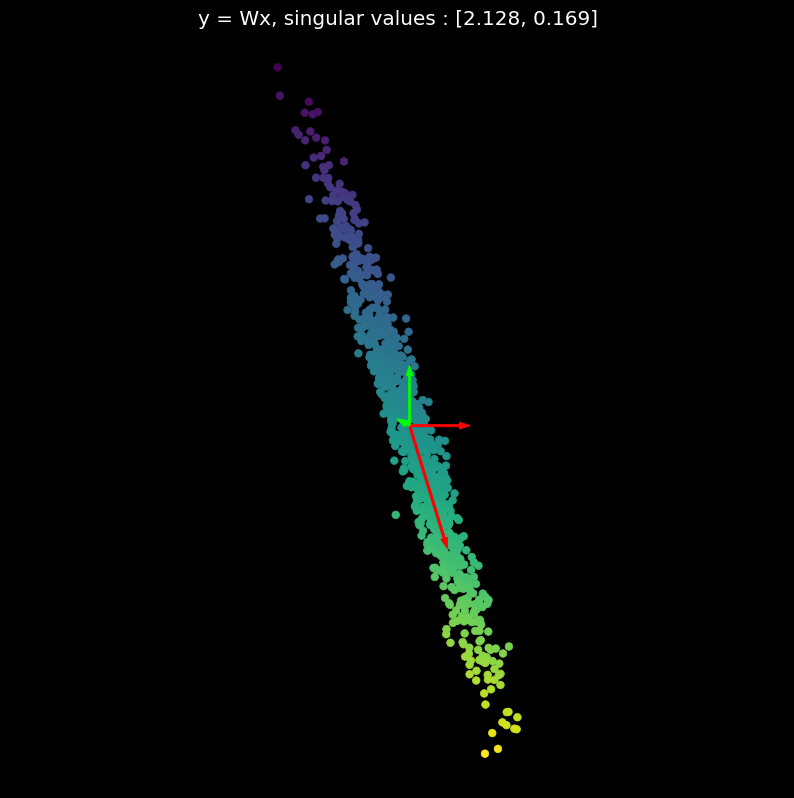

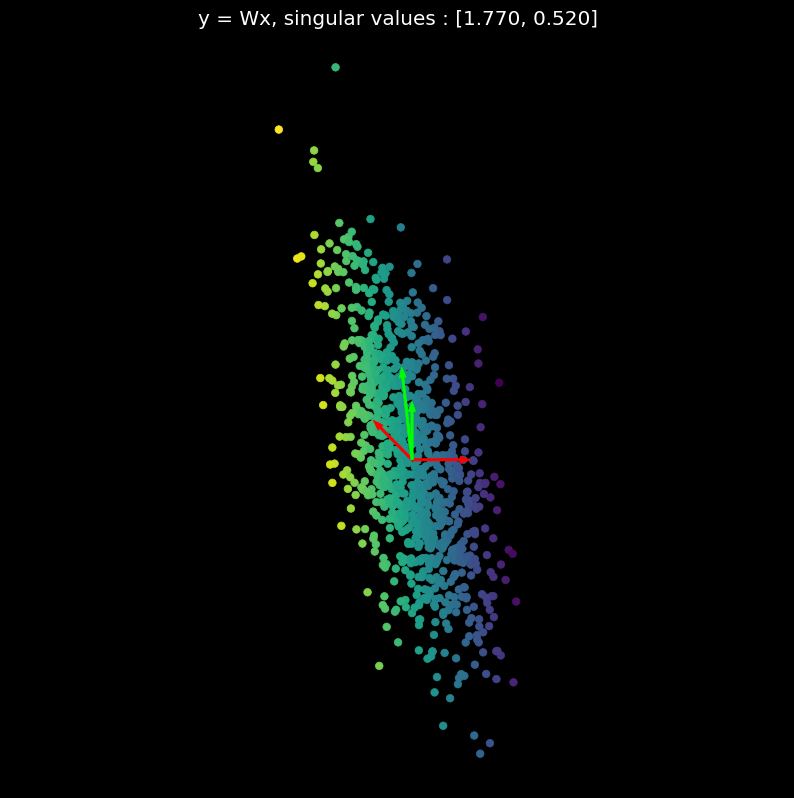

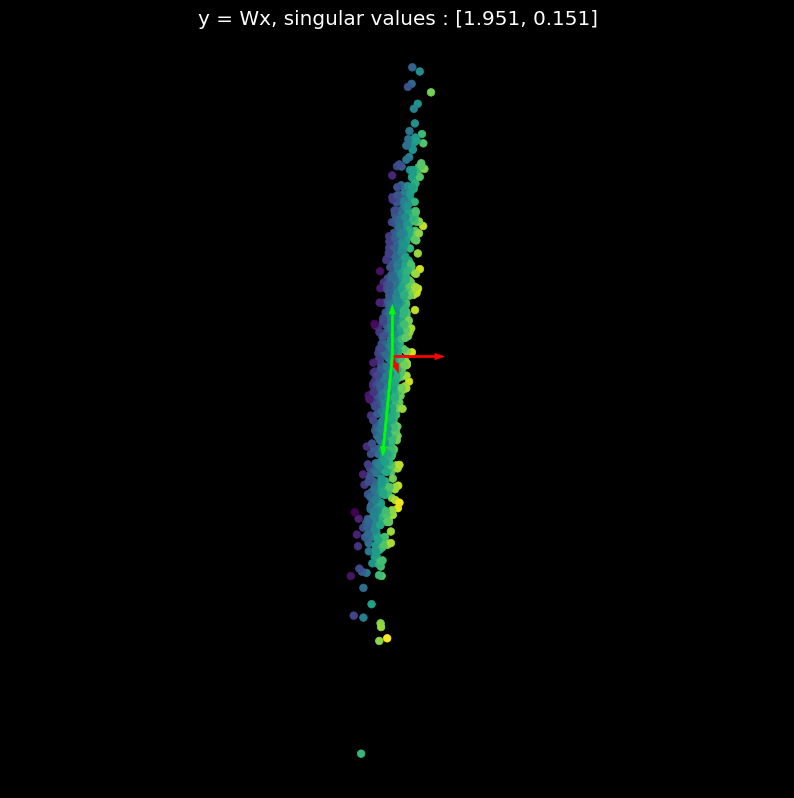

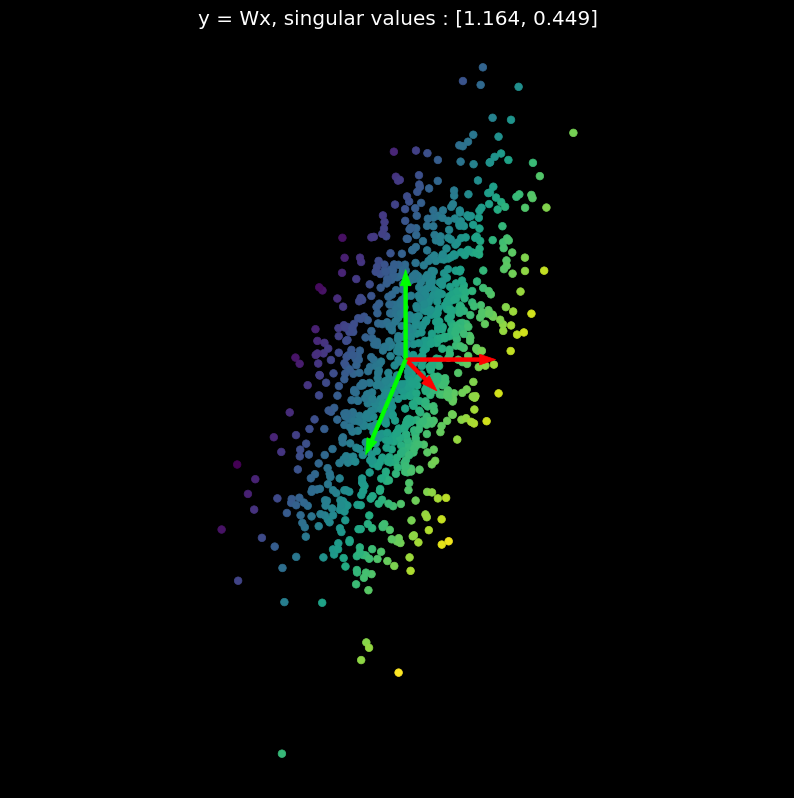

In [17]:
show_scatterplot(X, colors, title='X')
plot_bases(OI)

for i in range(10):
    # create a random matrix
    W = torch.randn(2, 2).to(device)
    # transform points
    Y = X @ W.t()
    # compute singular values
    U, S, V = torch.svd(W)
    # plot transformed points
    show_scatterplot(Y, colors, title='y = Wx, singular values : [{:.3f}, {:.3f}]'.format(S[0], S[1]))
    # transform the basis
    new_OI = OI @ W.t()
    # plot old and new basis
    plot_bases(OI)
    plot_bases(new_OI)

Perfect. As we can see a multiplication by a W matrix, it is a  **Linear Transformation**, only can expand or shrink the axis and rotate or reflect them. In summary:
* Larger singular values stretch the points
* Smaller singular values push them together
* $U, V$ rotate/reflect

----
**Doubt**: Why if linear transformation only can rotate/reflect and expand/shrink the new axis of $x$ and $y$ are not always separated by 90 degrees?

**Response**: This is because the rotation/reflection depends of the base axis vector values (vector i and j). In the previous examples of only rotation/reflection the base axis vectors has the same length (i.e., vector i is [1,0] and vector j is [0,1]). For this reason, the rotation/reflection of each axis is the same, in consequence, the axises $x$ and $y$ are always separated by 90 degrees. But now, in the last transformation we apply the expand/shrink transformation to each axis independly. So, the new vector i and new vector j after the transformation are of different length, in consequence, the rotation/reflection affects in different way to each axis.

We are going to do some experiments to demostrate this response:


In [18]:
# create a random matrix
W = torch.randn(2, 2).to(device)

# compute singular values
U, S, V = torch.svd(W)
V = torch.eye(2).to(device)

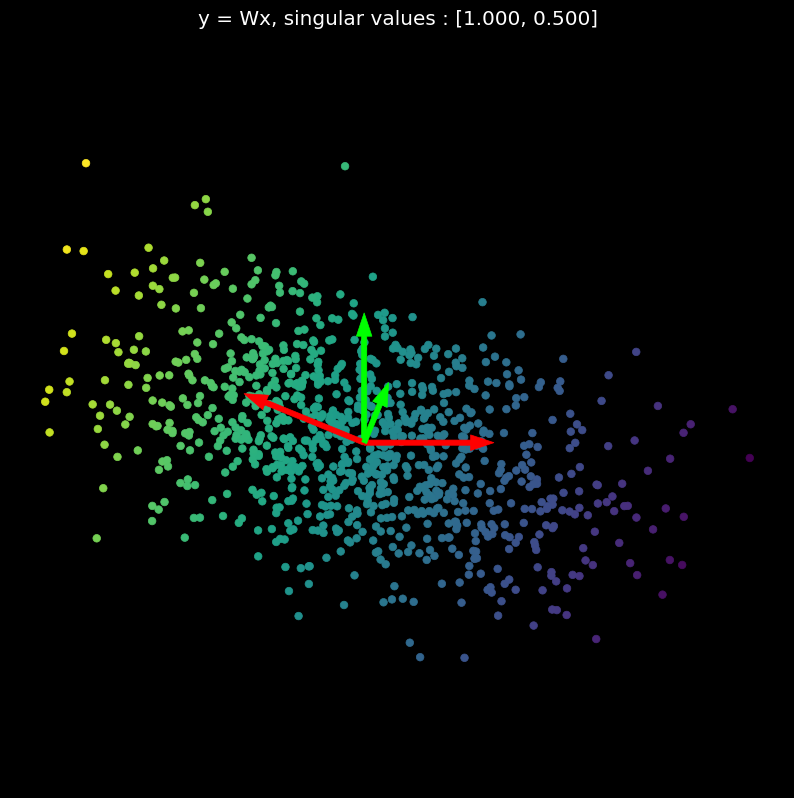

In [19]:
# Example S
S = torch.diag(torch.Tensor([1, 0.5]).to(device))

W_new = torch.mm(torch.mm(U,S), V.t())

# transform points only by S
Y = X @ W_new.t()

# plot transformed points
show_scatterplot(Y, colors, title='y = Wx, singular values : [{:.3f}, {:.3f}]'.format(1, 0.5))

# transform the basis
new_OI = OI @ W_new.t()

# plot old and new basis
plot_bases(OI)
plot_bases(new_OI)
show()

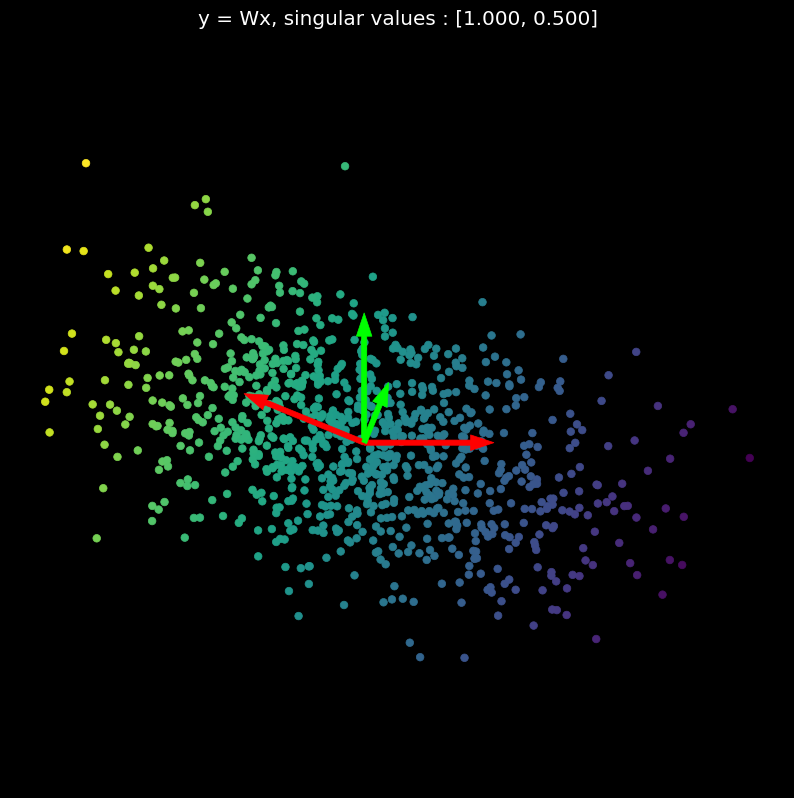

In [20]:
# Example S
S = torch.diag(torch.Tensor([1, 0.5]).to(device))

W_new = torch.mm(torch.mm(U,S), V.t())

# transform points only by S
Y = X @ W_new.t()

# plot transformed points
show_scatterplot(Y, colors, title='y = Wx, singular values : [{:.3f}, {:.3f}]'.format(1, 0.5))

# transform the basis
new_OI = OI @ W_new.t()

# plot old and new basis
plot_bases(OI)
plot_bases(new_OI)
show()

## Linear transformation with PyTorch

Now we demostrate the way in wich you can use PyTorch to implement a *Linear transformation* as in the previous section: $y = Wx$

In [21]:
# We define a sequential network only with a linear layer (only W multiplication)
model = nn.Sequential(
        nn.Linear(2, 2, bias=False)
)

print("Weight matrix random generated in the Linear layer of the sequential pytorch network:")
print(model[0].weight)


model.to(device)
pass

Weight matrix random generated in the Linear layer of the sequential pytorch network:
Parameter containing:
tensor([[ 0.4251,  0.3666],
        [ 0.4847, -0.0504]], requires_grad=True)


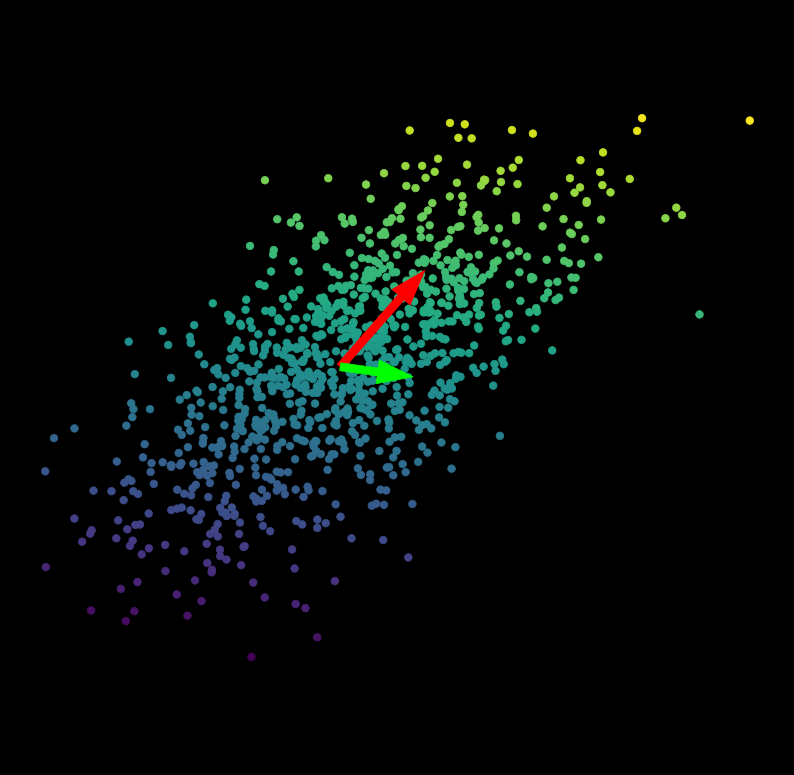

In [22]:
# We apply the network to all the points
with torch.no_grad():
    Y = model(X)
    show_scatterplot(Y, colors)
    plot_bases(model(OI))

We can see the result is the same as we apply manually the Linear Transformation (i.e., rotate/reflect and expand/shrink)

## Non-linear Transform: Map Points to a Square

* Linear transforms can rotate, reflect, stretch and compress, but cannot curve
* We need non-linearities for this
* Can (approximately) map points to a square by first stretching out (capable of being made longer or wider) by a factor $s$, then squashing (crush or squeeze so that it becomes flat, soft, or out of shape) with a tanh function (**note**: this is only an example of non-linear transformation)

$
   f(x)= \tanh \left(
  \left[ {\begin{array}{cc}
   s & 0 \\
   0 & s \\
  \end{array} } \right]  
  x
  \right)
$

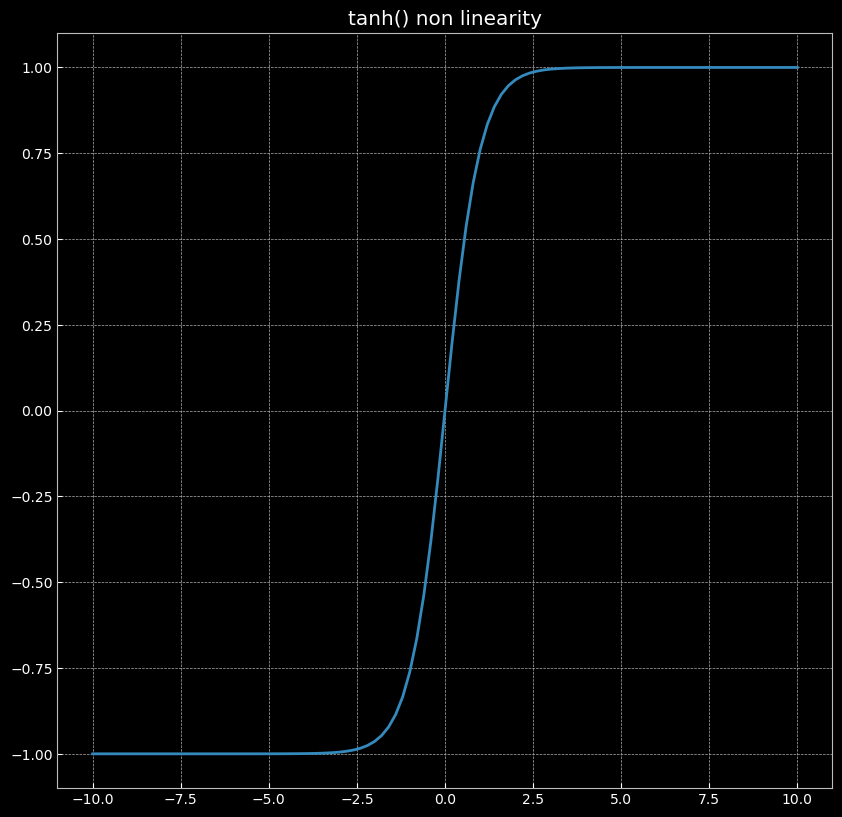

In [23]:
z = torch.linspace(-10, 10, 101)
s = torch.tanh(z)
plot(z.numpy(), s.numpy())
title('tanh() non linearity');

In this non-linear transformation transforms any value bigger than *2.5* in  *almost 1* and less than *-2.5* in *almost -1*. At same time, the rest of values (between *-2.5* and *2.5*) are transformed in a quasy-linear way, more linear when the value is more close to 0.

We can view it easier with a numeric transformations:

In [24]:
input_values = torch.Tensor([-100.0, -50.0, -5, -2.5, -1, -0.5, 0.0, 0.5, 1.0, 2.5, 50.0, 100.0])
output_values = torch.tanh(input_values)

print("Tanh non-linear transformation results:")
for idx in range(len(input_values)):
    print("\t > Input: {:.4f}\t - Output : {:.4f}".format(input_values[idx], output_values[idx]))

Tanh non-linear transformation results:
	 > Input: -100.0000	 - Output : -1.0000
	 > Input: -50.0000	 - Output : -1.0000
	 > Input: -5.0000	 - Output : -0.9999
	 > Input: -2.5000	 - Output : -0.9866
	 > Input: -1.0000	 - Output : -0.7616
	 > Input: -0.5000	 - Output : -0.4621
	 > Input: 0.0000	 - Output : 0.0000
	 > Input: 0.5000	 - Output : 0.4621
	 > Input: 1.0000	 - Output : 0.7616
	 > Input: 2.5000	 - Output : 0.9866
	 > Input: 50.0000	 - Output : 1.0000
	 > Input: 100.0000	 - Output : 1.0000


As we can see, it depends on the value (ex., bigger or less than a threshold) how the transformation is different. Not all the values obtains the same transformation. So, it is a **non-linear transformation**.

----

Now we are going to test to apply first the linear transformation (W matrix) and then the non-linear transformation to the generated points. 

In fact, the linear transformation to use it is going to be a simple expansion by a factor (W only with S matrix with information)

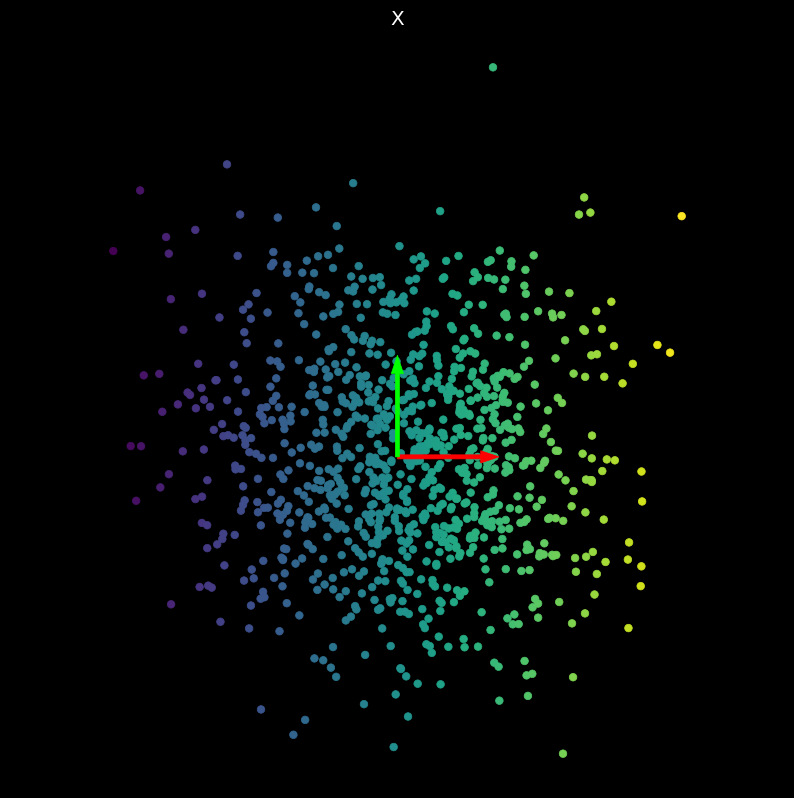


Linear transformation, expand by factor : 1


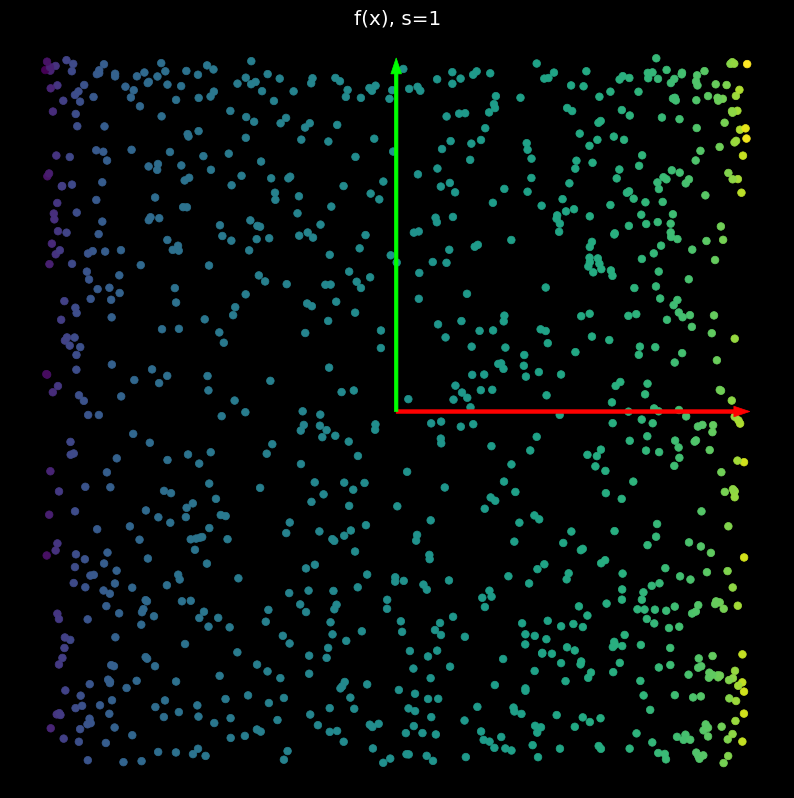


Linear transformation, expand by factor : 2


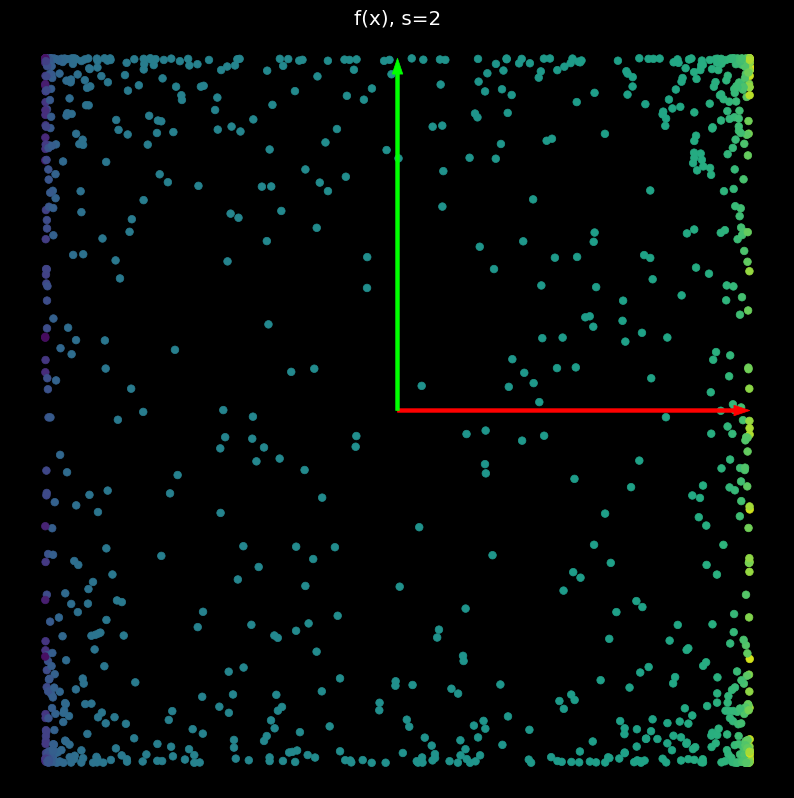


Linear transformation, expand by factor : 3


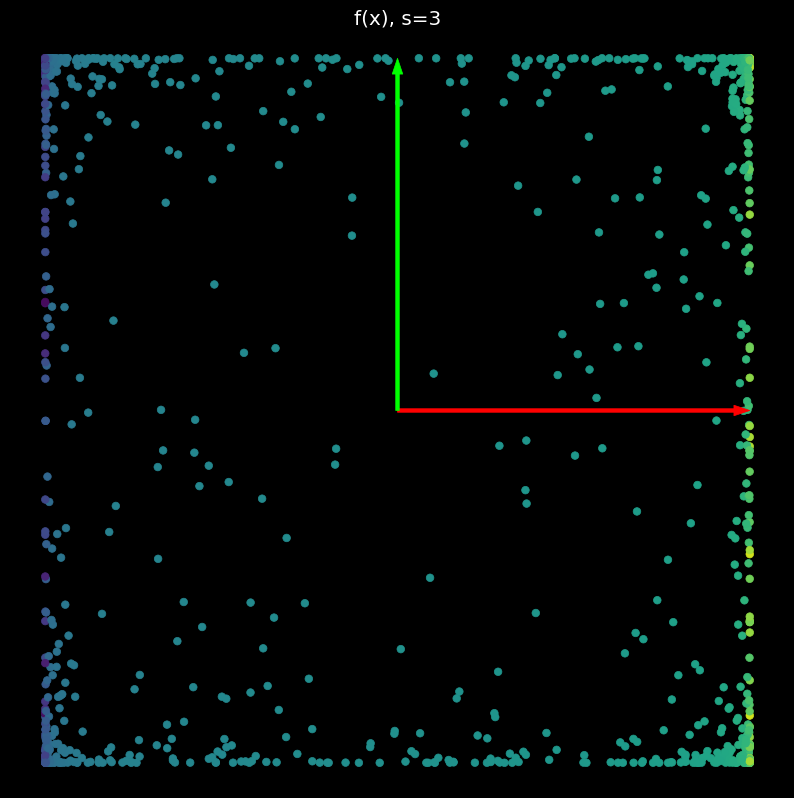


Linear transformation, expand by factor : 4


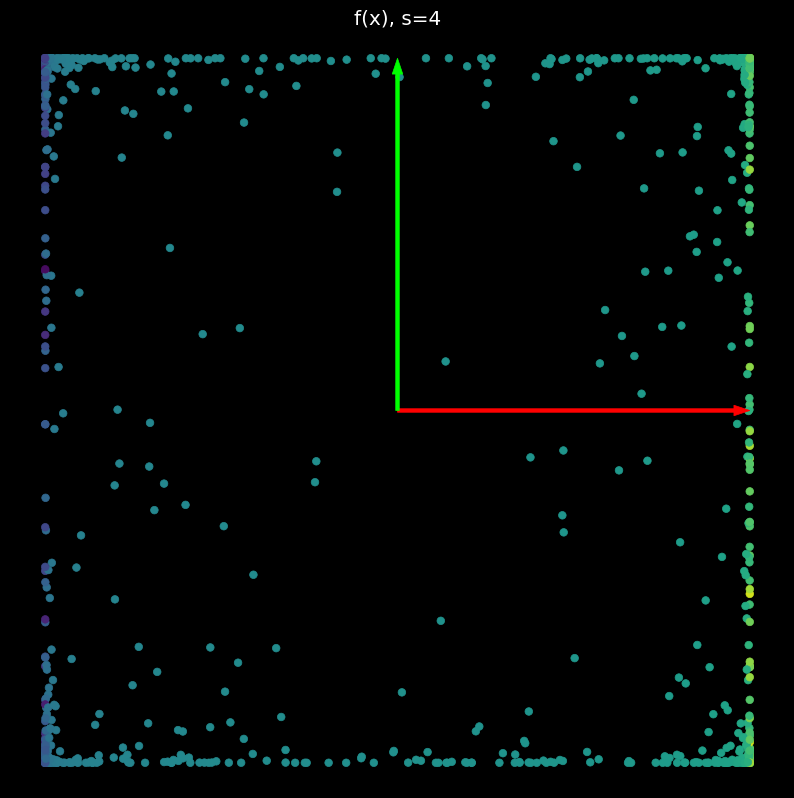


Linear transformation, expand by factor : 5


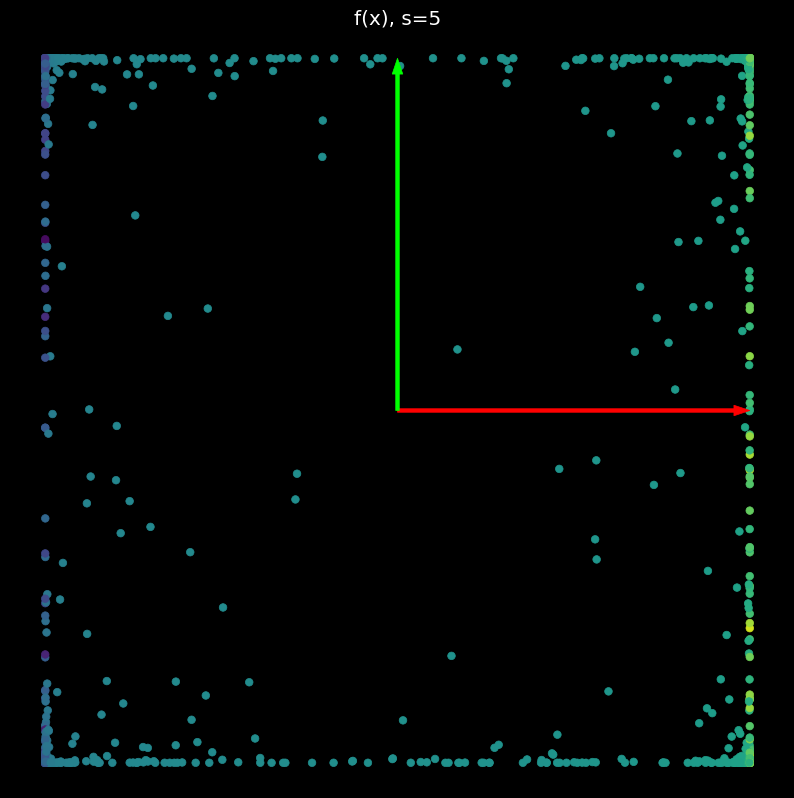

In [25]:
# We visualize the original generated points
show_scatterplot(X, colors, title='X')
plot_bases(OI)
show()
print()

# We create the sequential network with the linear and non-linear transformations
model = nn.Sequential(
        nn.Linear(2, 2, bias=False),
        nn.Tanh()
)
model.to(device)

# Now we generate 5 examples
for s in range(1, 6):
    
    # Assign the W of the network with only the S matrix to expand by a expacific factor
    print(f"Linear transformation, expand by factor : {s}")
    W = s * torch.eye(2)
    model[0].weight.data.copy_(W)
    
    # Apply the model
    Y = model(X).data
    
    # Visualize the result transformation
    show_scatterplot(Y, colors, title=f'f(x), s={s}')
    plot_bases(OI, width=0.01)
    show()
    print()

When we expand the points we make more of them bigger of *2.5* or less of *-2.5* by each of these axis (x and y). When some these axis values reach some of these thresholds its transformation outputs *1* or *-1*. It makes that all the points are contained in a square of: x axis limits [1,-1] and y axis limits [1,-1]. 

Of course, when we expand by a bigger factor more points of our distribution reach the threshold.

## Visualize Functions Represented by Random Neural Networks

A Neural Network is composed by one to more hidden layer. A hidden layer is composed by a Linear Transformation (W matrix multiplication) and then a Non-Linear Transformation. 

In this section we are going to test different Neural Networks with random values (random W matrix).

* Random Neural Network with only one hidden layer 

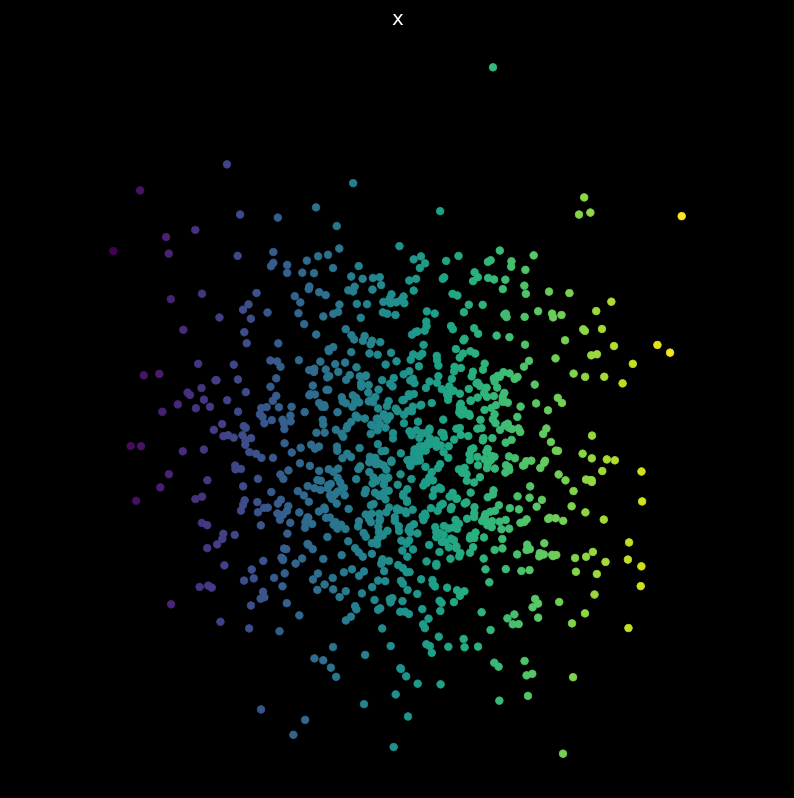

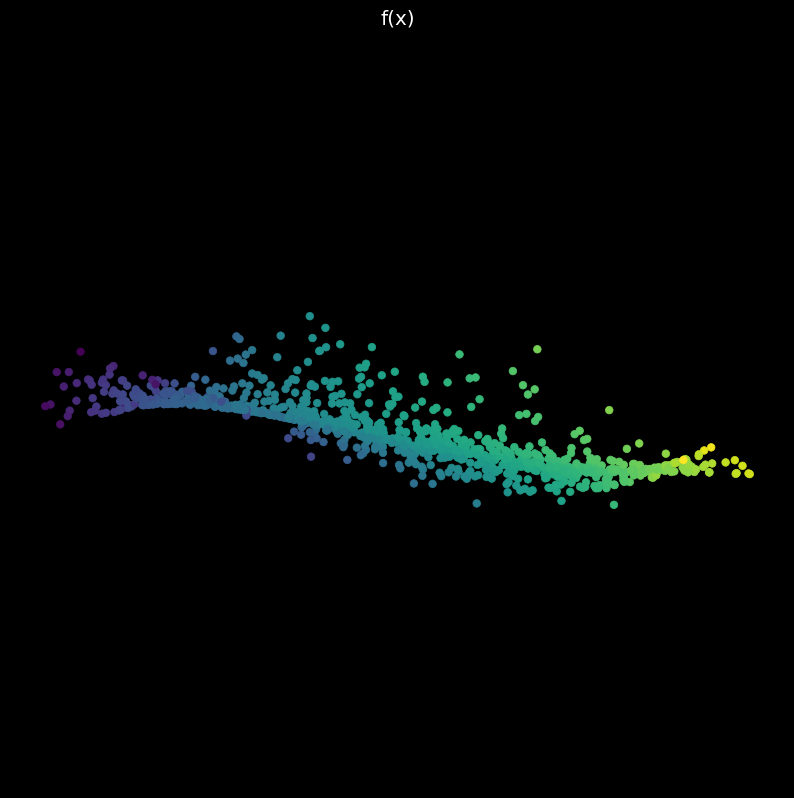

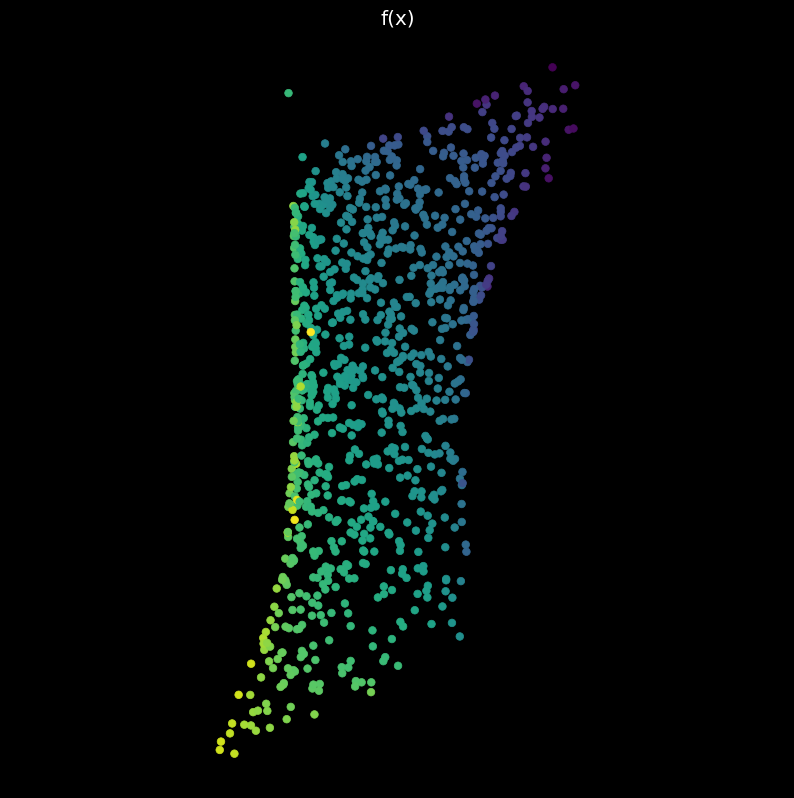

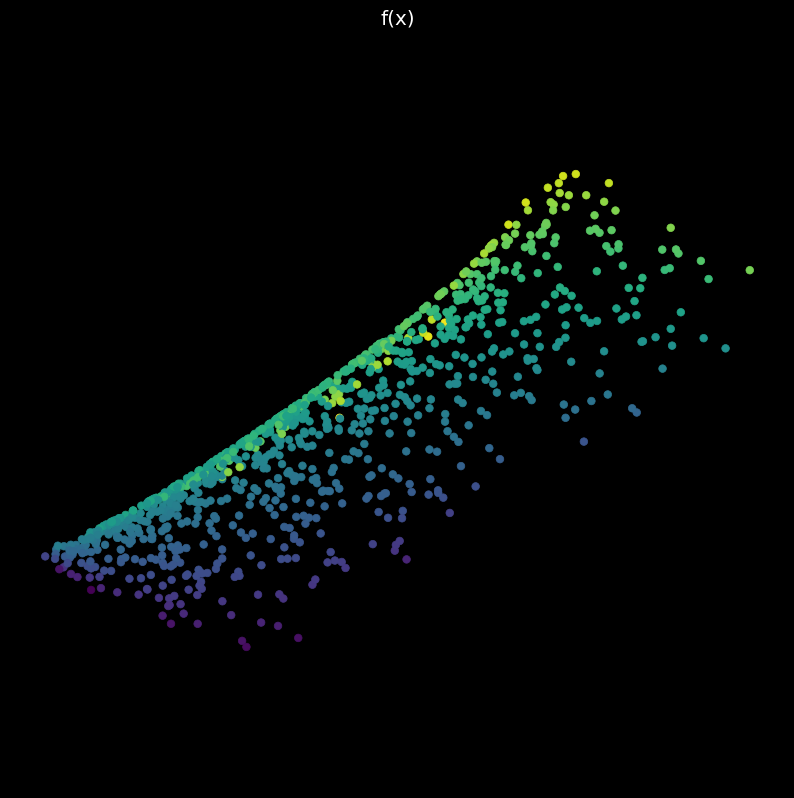

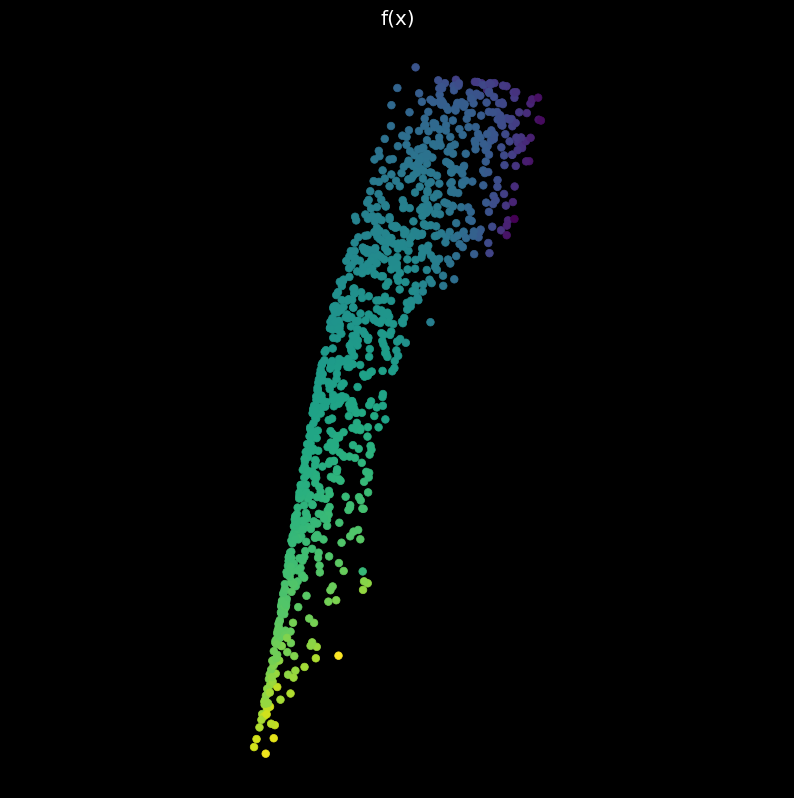

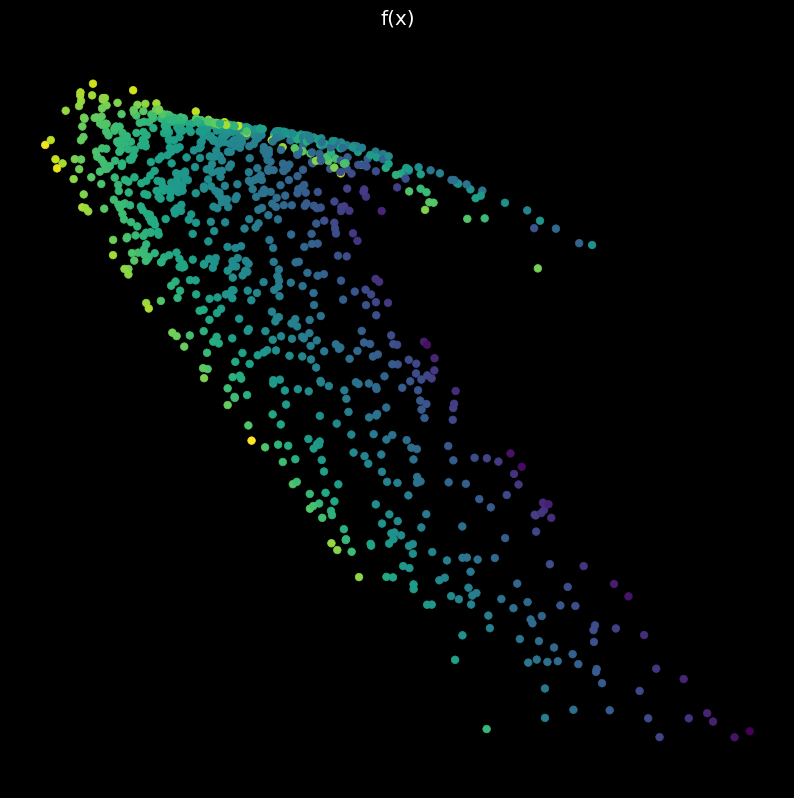

In [26]:
show_scatterplot(X, colors, title='x')
n_hidden = 5

# NL = nn.ReLU()
NL = nn.Tanh()

for i in range(5):
    # create 1-layer neural networks with random weights
    model = nn.Sequential(
            nn.Linear(2, n_hidden), 
            NL, 
            nn.Linear(n_hidden, 2)
        )
    model.to(device)
    with torch.no_grad():
        Y = model(X)
    show_scatterplot(Y, colors, title='f(x)')
#     plot_bases(OI)

* Random Neural Network with 5 hidden layer 

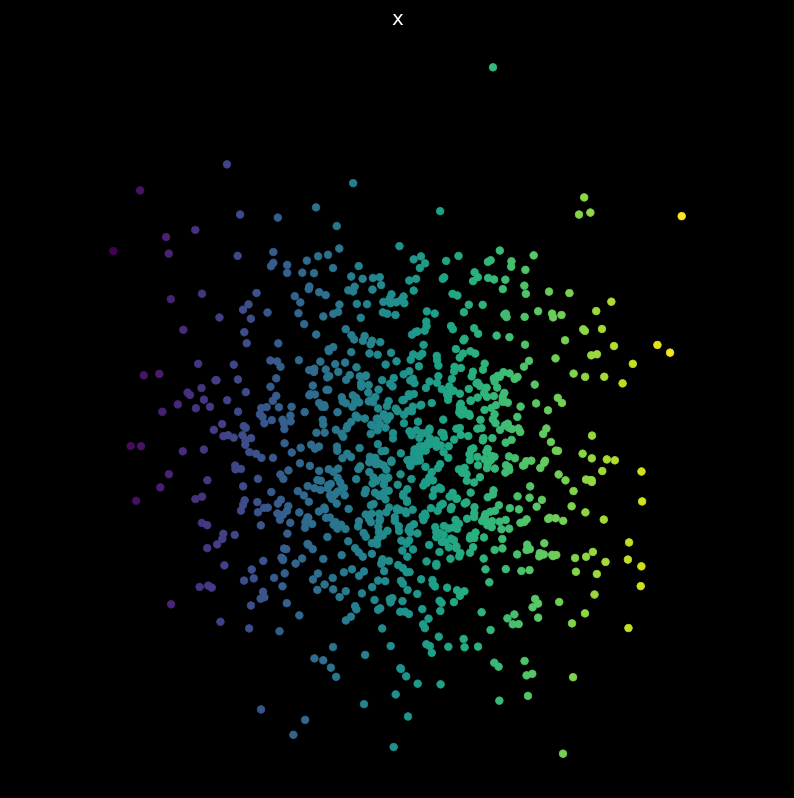

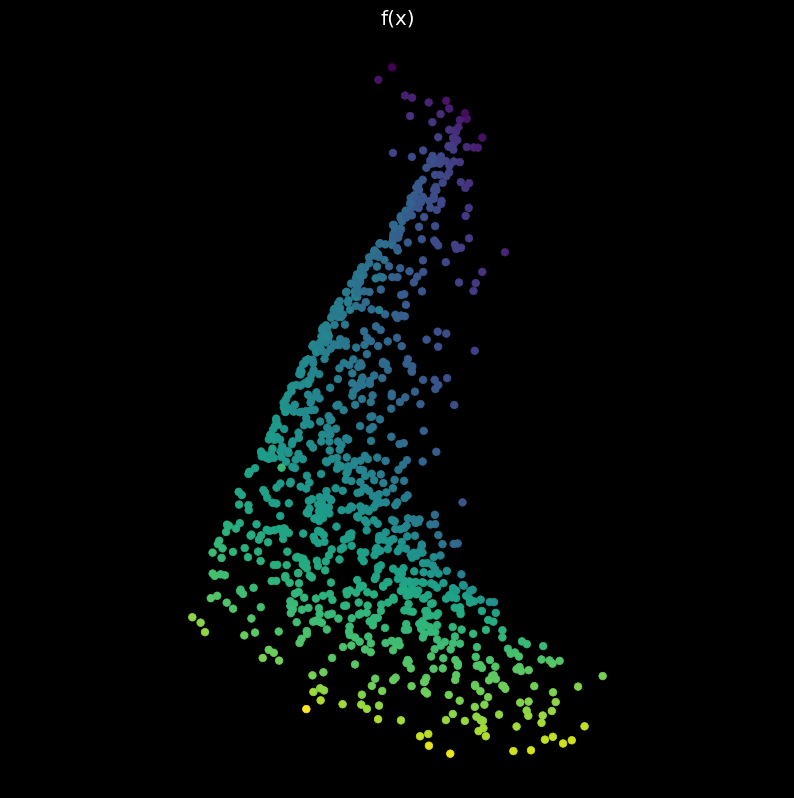

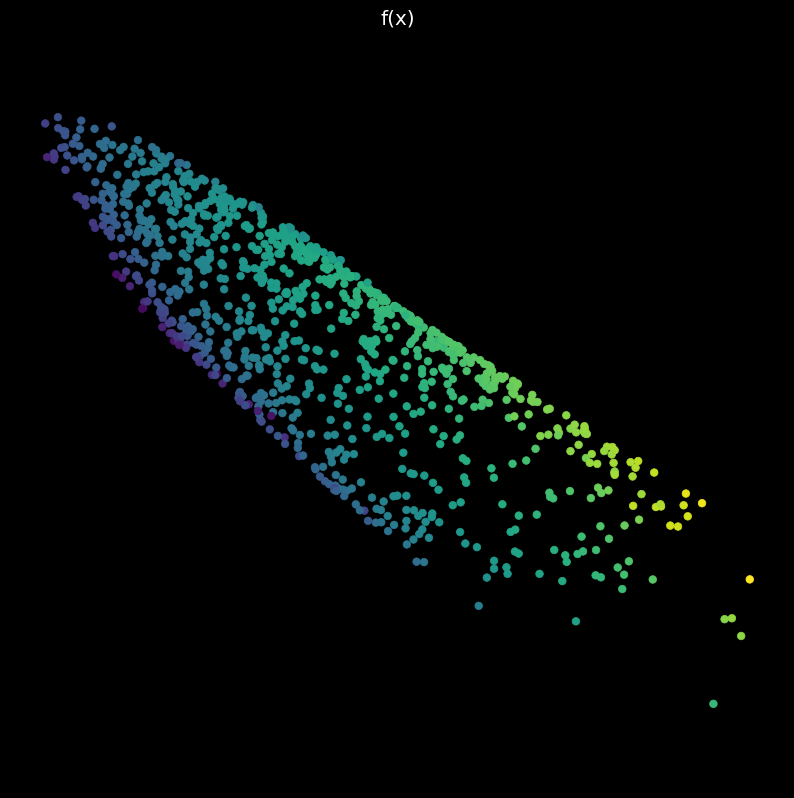

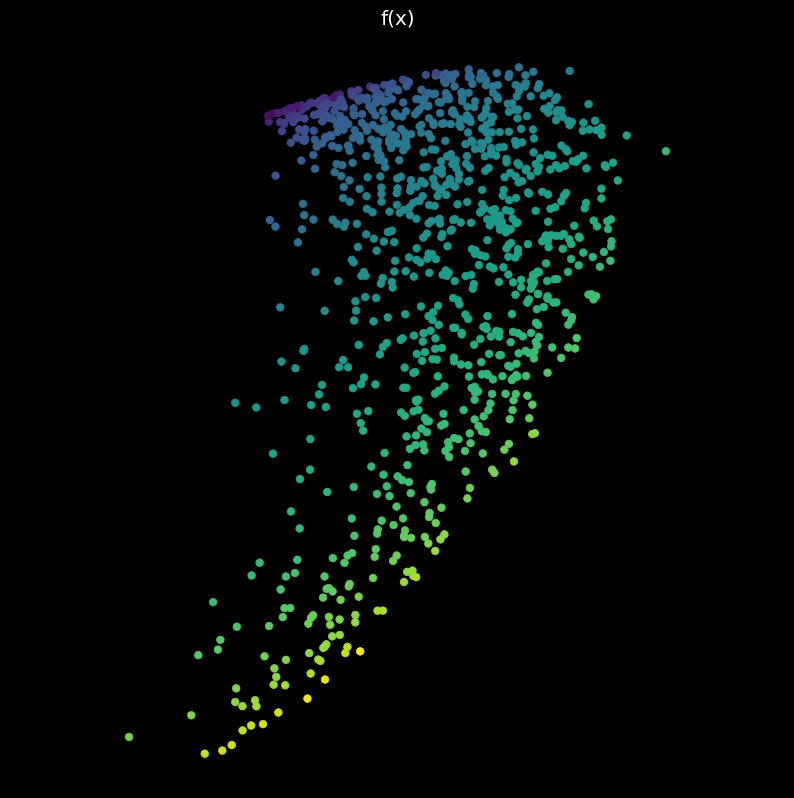

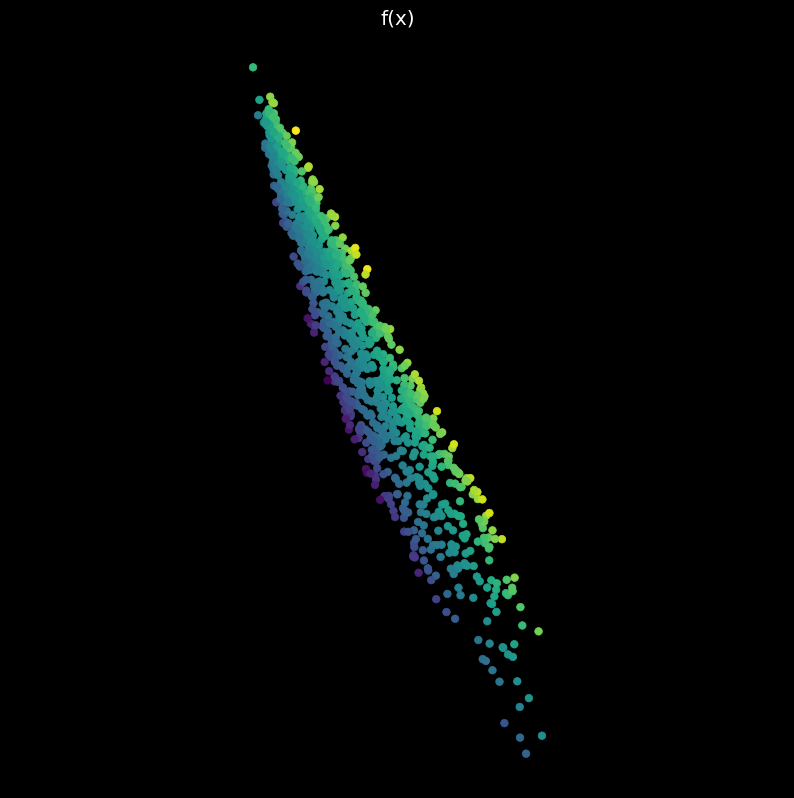

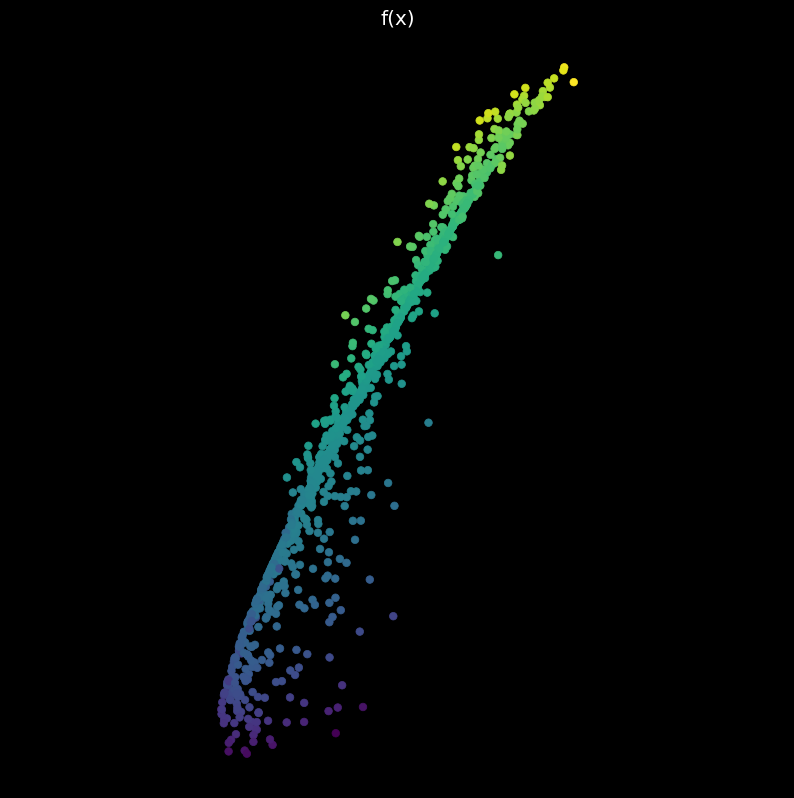

In [27]:
# deeper network with random weights
show_scatterplot(X, colors, title='x')
n_hidden = 5

# NL = nn.ReLU()
NL = nn.Tanh()

for i in range(5):
    model = nn.Sequential(
        nn.Linear(2, n_hidden), 
        NL, 
        nn.Linear(n_hidden, n_hidden), 
        NL, 
        nn.Linear(n_hidden, n_hidden), 
        NL, 
        nn.Linear(n_hidden, n_hidden), 
        NL, 
        nn.Linear(n_hidden, 2)
    )
    model.to(device)
    with torch.no_grad():
        Y = model(X).detach()
    show_scatterplot(Y, colors, title='f(x)')